In this section we use frequency domain methods proposed by Amin et al (2023) to produce a deepfake detector (classification method). Later we use these methods to build a bolt-on generative adversarial network (GAN) which reduces the effectiveness of such detection methods.

In [1]:
import csv
import cv2
import gc
import math
import numpy as np
import pandas as pd
import os
import random
import scipy
import seaborn as sns
import sklearn
import sklearn.decomposition
import sklearn.ensemble
import sklearn.manifold
import sklearn.metrics
import sklearn.model_selection
import sklearn.preprocessing
import sklearn.svm
import sklearn.tree
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.models import resnet50, ResNet50_Weights
import warnings

from matplotlib import pyplot as plt
from tqdm import tqdm

warnings.filterwarnings("ignore")

Our dataset is the Celeb-DF data set which is comprised of deep fake videos. We will first attempt deepfake detection on deepfake images for a frame based detection method, then expand our methods to video segments. The purpose of this is to verify the statistical properties demonstrated in Amin et al (2023) on 2-dimensional data before we analyze 3-dimensional data (time & space).

To this end, we take our video dataset, and break it up into an image dataset.

In [2]:
real_path = 'Celeb-DF/Celeb-real'
fake_path = 'Celeb-DF/Celeb-synthesis'
imag_path = 'Celeb-DF/Images'
if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'
seed = 752
batch_size = 256
combo_spectral_data = pd.read_csv('combo_spectral_data_frame&video_ids.csv')

In [3]:
def vid2im(video_path, imag_path, rf):
    print('Video/input path:', video_path)
    print('Image/output path:', imag_path)
    print('Data type:', rf)
    t_start = time.time()
    video_list = os.listdir(video_path)
    frame_num = 0
    img_vid_dict = {}
    vid_img_dict = {}
    z_pad = math.ceil(math.log10(len(video_list)*15*30))
    for video_name0 in tqdm(video_list):
        vid_img_dict[video_name0] = []
        video_name = os.path.join(video_path, video_name0)
        video = cv2.VideoCapture(video_name)
        while True:
            flag, frame = video.read()
            if not flag:
                break
            frame_num += 1
            frame_name0 = '.'.join([rf,str(frame_num).zfill(z_pad), 'jpg'])
            vid_img_dict[video_name0].append(frame_name0)
            img_vid_dict[frame_name0] = video_name0
            frame_name = os.path.join(imag_path, frame_name0)
            cv2.imwrite(frame_name, frame)
        video.release()
    t_end = time.time()
    t_delta = t_end - t_start
    print(f'Video-set to image-set conversion completed in {t_delta//60} minutes {math.floor(t_delta%60)} seconds')
    return vid_img_dict, img_vid_dict

class IMG_gen:
    def __init__(self, img_path):
        self.path_gen = os.scandir(img_path)
        self.state = 0
        self.path = None
        self.img = None
        self.label = None
        self.label_dict = {'f':1, 'r':0}
    
    @staticmethod
    def get_img_color(path):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        return img
    
    def __next__(self):
        self.path = next(self.path_gen)
        self.label = self.label_dict[os.path.basename(self.path)[0]]
        self.state += 1
        self.img = self.get_img_color(self.path)
        return self.img, self.label

class FACE_gen(IMG_gen):
    def __init__(self, img_path):
        super().__init__(img_path)
        self.facial = cv2.CascadeClassifier('haarcascade_frontalface_alt.xml').detectMultiScale
    
    def get_face_box(self, img):
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        try:
            x,y,w,h = self.facial(img_gray, minSize=(10, 10))[0]
            return x, y, x+w, y+h
        except:
            return None
    
    def __next__(self):
        self.path = next(self.path_gen)
        self.label = self.label_dict[os.path.basename(self.path)[0]]
        self.state += 1
        self.img = self.get_img_color(self.path)
        self.xyxy = self.get_face_box(self.img)
        try:
            self.face = self.img[self.xyxy[1]:self.xyxy[3],
                                 self.xyxy[0]:self.xyxy[2],
                                 :]
        except:
            self.face = None
        return (self.face, self.label)

class BKGD_gen(FACE_gen):
    def __init__(self, img_path):
        super().__init__(img_path)
        self.bkdg = None
    
    @staticmethod
    def get_bkgd_box(shape, x1, y1, x2, y2):
        def overlap_check(x, y):
            return not(x+w<x1 or
                       x>x2 or
                       y+h<y1 or
                       y>y2)
        w, h = x2-x1, y2-y1
        x_max, y_max = shape[1], shape[0]
        #We use up to 1k guesses for a background box
        for i in range(1000):
            x, y = random.randint(0, x_max-1-w), random.randint(0, y_max-1-h)
            if not overlap_check(x, y):
                break
            if i==1000-1 and overlap_check(x,y):
                print('Failed to retrieve a background in 1000 attempts')
                return None
        return x, y, x+w, y+w
    
    def __next__(self):
        self.path = next(self.path_gen)
        self.label = self.label_dict[os.path.basename(self.path)[0]]
        self.state += 1
        self.img = self.get_img_color(self.path)
        self.xyxy = self.get_face_box(self.img)
        try:
            self.face = self.img[self.xyxy[1]:self.xyxy[3],
                                 self.xyxy[0]:self.xyxy[2],
                                 :]
        except:
            self.face = None
        self.bkgd_xyxy = self.get_bkgd_box(self.img.shape, *self.xyxy)
        try:
            self.bkgd = self.img[self.bkgd_xyxy[1]:self.bkgd_xyxy[3],
                                 self.bkgd_xyxy[0]:self.bkgd_xyxy[2],
                                 :]
        except:
            self.bkgd = None
        return (self.bkgd, self.label)
    
def spec_stats(img):
    '''Returns the feature vector for the image:
            cor_rb, cor_rb, cor_gb, m_rgb, mu_rgb, M_rgb
        in complex spectrum then amplitude spectrum'''
    def get_stats(chan1, chan2, chan3):
        mean_stats = []
        spec_stats = []
        spec_stats.append([np.corrcoef(chan1, chan2).real[0,1],
                           np.corrcoef(chan1, chan3).real[0,1],
                           np.corrcoef(chan2, chan3).real[0,1]])
        mean_stats.append([np.mean(np.abs(chan1 - chan2)).real,
                           np.mean(np.abs(chan1 - chan3)).real,
                           np.mean(np.abs(chan2 - chan3)).real])
        spec_stats.append([np.min(mean_stats),
                           np.mean(mean_stats),
                           np.max(mean_stats)])
        return spec_stats
    img = img.astype('float32')
    img -= img.mean(axis=(0,1))
    img_fft = np.fft.fft2(img, axes=(0,1), norm='forward')
    red_fft = img_fft[:,:,0].flatten()
    green_fft = img_fft[:,:,1].flatten()
    blue_fft = img_fft[:,:,2].flatten()
    spec_stats = []
    spec_stats.append(get_stats(red_fft, green_fft, blue_fft))
    spec_stats.append(get_stats(np.abs(red_fft), np.abs(green_fft), np.abs(blue_fft)))
    return np.array(spec_stats).flatten().astype('float32')

def spec_feat_extr(img_gen):
    t_0 = time.time()
    col_names = ['cor_rg', 'cor_rb', 'cor_gb',
                 'm_rgb', 'mu_rgb', 'M_rgb',
                 'cor_|rg|', 'cor_|rb|', 'cor_|gb|',
                 'm_|rgb|', 'mu_|rgb|', 'M_|rgb|',
                 'label']
    data = []
    i = 0
    t_start = time.time()
    while True:
        i+=1
        if i%1000 ==0:
            t_end = time.time()
            dt = t_end-t_start
            print(f'{dt//60} min {math.floor(dt%60)} per 1000 images, {i//1000}k images complete')
            t_start = time.time()
        try:
            x, y = next(img_gen)
        except TypeError:
            continue
        except:
            break
        if isinstance(x, type(None)):
            continue
        data.append(np.concatenate((spec_stats(x),np.array([y]))))
    data_frame = pd.DataFrame(data, columns=col_names)
    dt = time.time() - t_0
    hr = dt//3600
    mn = dt//60 - 60*hr
    sc = math.floor(dt%60)
    print(f'Total run time {hr} hours {mn} minutes {sc} seconds')
    return data_frame

def visualize_samples(samples, labels, title="Samples visualization", colors=["b", "r"]):
    """ Visualize first three dimensions of samples. """
    # Convert colors to NumPy array
    colors = np.array(colors)
    # Create figure
    fig = plt.figure(figsize=(20, 5))
    
    # Plot first two dimensions on a 2D plot
    ax_2d = fig.add_subplot(1, 2, 1)
    ax_2d.set_title(f"{title} [2D]")
    ax_2d.scatter(samples[:, 0], samples[:, 1], c=colors[labels], s=10)
    
    # Plot first three dimensions on a 3D plot
    ax_3d = fig.add_subplot(1, 2, 2, projection="3d")
    ax_3d.set_title(f"{title} [3D]")
    ax_3d.scatter(samples[:, 0], samples[:, 1], samples[:, 2], c=colors[labels],s=10)
    print(fig)

class VAE(nn.Module):
    def __init__(self, schedule=(12,9,7,5,3), device=device):
        #Instanciates the VAE as a pytorch module for autograd
        super(VAE, self).__init__()
        #Forms the encoder/decoder layers as a list following a schedule
        def ED_layers(schedule):
            layers = []
            for ind in range(len(schedule)-2):
                i_put, o_put = schedule[ind], schedule[ind+1]
                #Linear layers due to the non-shift invarient datatype
                layers.extend([nn.Linear(i_put, o_put),
                #Batch norm to prevent exploding gradients and neuron weights
                              nn.BatchNorm1d(o_put),
                              nn.ReLU(),
                #Dropout to improve generalization
                              nn.Dropout()])
            i_put, o_put = schedule[-2], schedule[-1]
            #Terminal linear layer before use encoder-latent or decoder-reconstruction
            layers.append(nn.Linear(i_put, o_put))
            return layers
        self.encoder = nn.Sequential(*ED_layers(schedule))
        self.decoder = nn.Sequential(*ED_layers(schedule[::-1]))
        self.min_val_loss = float('inf')
        self.device = device
        self.encoder.to(self.device)
        self.decoder.to(self.device)
        print(self)
        
    def forward(self, x):
        x = x.to(device)
        x = self.encoder(x)
        x = self.decoder(x)
        return x
    
    def latent(self, x):
        x = x.to(self.device)
        self.eval()
        with torch.no_grad():
            x_latent = self.encoder(x)
        return x_latent.detach().to('cpu')
    
    def VAE_train(self, train_loader, valid_loader, n_epochs=100, loss=nn.MSELoss(), optimizer=optim.Adam, model_path='VAE_model'):
        optimizer = optimizer(self.parameters(), lr=.0005, betas=(.5,.999))
        epoch_bar = tqdm(range(n_epochs),desc='Epoch', initial=1)
        self.training_loss, self.validation_loss = [], []
        
        print('VAE training started:')
        for epoch in epoch_bar:
            loss_train = loss_valid = 0
            batch_size = set_size = 0
            #training
            self.train(True)
            for data in train_loader:
                #training
                x = y = data[0].to(self.device)
                optimizer.zero_grad()
                x = self(x)
                loss_0 = loss(x,y)
                loss_0.backward()
                optimizer.step()
                #statistics
                batch_size = x.shape[0]
                set_size += batch_size
                loss_train += loss_0.item()*batch_size
            loss_train /= set_size
            
            batch_size = set_size = 0
            #evaluation
            self.eval()
            with torch.no_grad():
                for data in valid_loader:
                    #evaluation
                    x = y = data[0].to(self.device)
                    x = self(x)
                    loss_1 = loss(x,y)
                    #statistics
                    batch_size = x.shape[0]
                    set_size += batch_size
                    loss_valid += loss_1.item()*batch_size
            loss_valid /= set_size
            
            if loss_valid < self.min_val_loss:
                self.min_val_loss = loss_valid
                model_path+'_epoch_{}'.format(epoch)
                torch.save(self.state_dict(), model_path)
                
            epoch_bar.set_postfix({'training loss':loss_train,
                                   'validation loss':loss_valid,
                                   'best validation loss':self.min_val_loss})
            self.training_loss.append(loss_train)
            self.validation_loss.append(loss_valid)
        print(f'VAE training {n_epochs} epochs complete.')

def hist12(df_list, df_key = ('real', 'fake'), colors = ('b', 'r')):
    assert len(df_list) == len(df_key) == len(colors)
    col_list = list(df_list[0].columns)
    fig, ax = plt.subplots(2,3, figsize=(12, 8))
    for ind in range(6):
        col = col_list[ind]
        #ax[ind//3, ind%3].set_xlim(left=.75)
        for df, df_k, c in zip(df_list, df_key, colors):
            sns.histplot(df[col],
                         color=c,
                         kde=True,
                         stat="density",
                         ax=ax[ind//3, ind%3],
                         label = f'{col}: {df_k}')
    fig.suptitle('FSSF complex spectrum histograms')
    plt.tight_layout()
    plt.show()
    fig, ax = plt.subplots(2,3, figsize=(12, 8))
    for ind in range(6,12):
        col = col_list[ind]
        #ax[(ind-6)//3, (ind-6)%3].set_xlim(left=.75)
        for df, df_k, c in zip(df_list, df_key, colors):
            sns.histplot(df[col],
                         color=c,
                         kde=True,
                         stat="density",
                         ax=ax[(ind-6)//3, (ind-6)%3],
                         label = f'{col}: {df_k}')
    fig.suptitle('FSSF magnitude spectrum histograms')
    plt.tight_layout()
    plt.show()
        
def print_metrics(y_true, y_pred, y_score, estimator_name=None):
    confusion_matrix = sklearn.metrics.confusion_matrix(y_true, y_pred)
    fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_true, y_score)
    auc = round(sklearn.metrics.roc_auc_score(y_true, y_score) *100,2)

    print(f'Accuracy: {round(sklearn.metrics.accuracy_score(y_true, y_pred)*100,2)}%',
          f'Precision: {round(sklearn.metrics.precision_score(y_true, y_pred)*100,2)}%',
          f'Recall: {round(sklearn.metrics.recall_score(y_true, y_pred)*100,2)}%',
          f'F1: {round(sklearn.metrics.f1_score(y_true, y_pred)*100,2)}%',
          f'AUC: {auc}%',
          sep='\n')

    fig, ax = plt.subplots(1,2, figsize=(8, 4))
    fig.suptitle(f'{estimator_name} Confusion Matrix and ROC Curve')
    plt.tight_layout()
    display_confusion_matrix = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
    display_confusion_matrix.plot(ax=ax[0])
    display_roc_curve = sklearn.metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc, estimator_name=estimator_name)
    display_roc_curve.plot(ax=ax[1], plot_chance_level=True)
    plt.show()

def dim_red_tests(data_frame, data_type, schedule=(12,9,7,5,3), model_path='VAE_model', subsample=True):
    print(f'Dimensionality reduction tests: {data_type}')
    t_start = t_0 = time.time()
    x, y = data_frame.drop(columns='label'), data_frame['label'].astype('int')
    x_scaled = sklearn.preprocessing.StandardScaler().fit_transform(x)
    print(f'Data scaling: {math.floor(time.time()-t_0)} sec')
    
    t_0 = time.time()
    x_pca = sklearn.decomposition.PCA(3).fit_transform(x_scaled)
    visualize_samples(x_pca, y)
    print(f'Prinical Component Analysis (PCA): {math.floor(time.time()-t_0)} sec')

    if subsample:
        t_0 = time.time()
        random.seed(752)
        sample = random.sample(range(len(data_frame)), 12000)
        x_sampled, y_sampled = x_scaled[sample,:], y.iloc[sample]
        print(f'Subsampling: {math.floor(time.time()-t_0)} sec')
    else:
        print('Subsampling bipassed')
        x_sampled, y_sampled = x_scaled, y
    
    t_0 = time.time()
    x_pol = sklearn.decomposition.KernelPCA(kernel='poly').fit_transform(x_sampled)
    visualize_samples(x_pol, y_sampled)
    print(f'Kernel PCA Polynomial: {math.floor(time.time()-t_0)} sec')
    
    t_0 = time.time()
    x_rbf = sklearn.decomposition.KernelPCA(kernel='rbf').fit_transform(x_sampled)
    visualize_samples(x_rbf, y_sampled)
    print(f'Kernel PCA Radial Basis Function (RBF): {math.floor(time.time()-t_0)} sec')
    
    t_0 = time.time()
    x_cos = sklearn.decomposition.KernelPCA(kernel='cosine').fit_transform(x_sampled)
    visualize_samples(x_cos, y_sampled)
    print(f'Kernel PCA Cosine: {math.floor(time.time()-t_0)} sec')
    
    t_0 = time.time()
    x_iso = sklearn.manifold.Isomap(n_components=3).fit_transform(x_sampled)
    visualize_samples(x_iso, y_sampled)
    print(f'Manifold learning Isomap: {math.floor(time.time()-t_0)} sec')
    
    t_0 = time.time()
    x_spe = sklearn.manifold.SpectralEmbedding(n_components=3).fit_transform(x_sampled)
    visualize_samples(x_spe, y_sampled)
    print(f'Manifold learning Spectral Embedding: {math.floor(time.time()-t_0)} sec')
    
    t_0 = time.time()
    x_tsn = sklearn.manifold.TSNE(n_components=3).fit_transform(x_sampled)
    visualize_samples(x_tsn, y_sampled)
    print(f'Manifold learning t-distributed Stochastic Neighbor Embedding (t-SNE): {math.floor(time.time()-t_0)} sec')
    
    t_0 = time.time()
    model_vae = VAE(schedule=schedule)
    x_train, x_valid, y_train, y_valid = sklearn.model_selection.train_test_split(x_scaled, y, test_size=.091, random_state=752)
    x_train = torch.tensor(x_train).to(torch.float32)
    x_valid = torch.tensor(x_valid).to(torch.float32)
    train_set = torch.utils.data.TensorDataset(x_train)
    valid_set = torch.utils.data.TensorDataset(x_valid)
    train_loader = torch.utils.data.DataLoader(train_set,batch_size=34000,shuffle=True)
    valid_loader = torch.utils.data.DataLoader(valid_set,batch_size=3500,shuffle=True)
    model_vae.VAE_train(train_loader, valid_loader, n_epochs=500, model_path=model_path)
    fig, ax = plt.subplots(1,1)
    ax.plot(model_vae.training_loss)
    ax.plot(model_vae.validation_loss)
    ax.set_xlabel('Epochs')
    ax.legend(['Training loss', 'Validation Loss'])
    plt.show()
    x_latent = model_vae.latent(torch.tensor(x_scaled).to(torch.float32)).detach().numpy()
    visualize_samples(x_scaled, y)
    print(f'Variational Autoencoder (VAE): {math.floor(time.time()-t_0)} sec')
    t_end = time.time()
    print(f'Dimensionality reduction tests complete: {(t_end-t_start)//60} min {math.floor((t_end-t_start)%60)}')

class VID_gen:
    def __init__(self, vid_path, label):
        self.path_gen = os.scandir(vid_path)
        self.state = 0
        self.path = None
        self.vid = None
        self.label = label
        
    def __next__(self):
        self.path = next(self.path_gen)
        video = cv2.VideoCapture(self.path)
        frame_list = []
        while True:
            flag, frame = video.read()
            if not flag:
                break
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame_list.append(frame)
        video.release()
        self.vid = np.array(frame_list)
        self.state += 1
        return self.vid, self.label
        #self.vid -> frame, height, width, channels

def spec_stats_video(video):
    def get_stats(chan1, chan2, chan3):
        mean_stats = []
        spec_stats = []
        spec_stats.append([np.corrcoef(chan1, chan2).real[0,1],
                           np.corrcoef(chan1, chan3).real[0,1],
                           np.corrcoef(chan2, chan3).real[0,1]])
        mean_stats.append([np.mean(np.abs(chan1 - chan2)).real,
                           np.mean(np.abs(chan1 - chan3)).real,
                           np.mean(np.abs(chan2 - chan3)).real])
        spec_stats.append([np.min(mean_stats),
                           np.mean(mean_stats),
                           np.max(mean_stats)])
        return spec_stats
    video = video.astype('float32')
    video -= video.mean(axis=(0,1,2)).astype('float32')
    video = scipy.fft.fft2(video, axes=(1,2), norm='forward').astype('complex64')
    gc.collect()
    red_fft = video[:,:,:,0].flatten().astype('float32')
    green_fft = video[:,:,:,1].flatten().astype('float32')
    blue_fft = video[:,:,:,2].flatten().astype('float32')
    data = []
    data.append(get_stats(red_fft, green_fft, blue_fft))
    data.append(get_stats(np.abs(red_fft), np.abs(green_fft), np.abs(blue_fft)))
    video = scipy.fft.fft(video, axis=0, norm='forward').astype('complex64')
    red_fft = video[:,:,:,0].flatten().astype('float32')
    green_fft = video[:,:,:,1].flatten().astype('float32')
    blue_fft = video[:,:,:,2].flatten().astype('float32')
    gc.collect()
    data.append(get_stats(red_fft.astype('float32'),
                          green_fft.astype('float32'),
                          blue_fft.astype('float32')))
    data.append(get_stats(np.abs(red_fft).astype('float32'),
                          np.abs(green_fft).astype('float32'),
                          np.abs(blue_fft).astype('float32')))
    return np.array(data).flatten().astype('float32')

def spec_feat_extr_video(vid_gen_list, csv_path, start_point=(0,0)):
    t_start = time.time()
    i = 0
    col_names = ['cor_tf_rg', 'cor_tf_rb', 'cor_tf_gb',
                 'm_tf_rgb', 'mu_tf_rgb', 'M_tf_rgb',
                 'cor_tf_|rg|', 'cor_tf_|rb|', 'cor_tf_|gb|',
                 'm_tf_|rgb|', 'mu_tf_|rgb|', 'M_tf_|rgb|',
                 'cor_ff_rg', 'cor_ff_rb', 'cor_ff_gb',
                 'm_ff_rgb', 'mu_ff_rgb', 'M_ff_rgb',
                 'cor_ff_|rg|', 'cor_ff_|rb|', 'cor_ff_|gb|',
                 'm_ff_|rgb|', 'mu_ff_|rgb|', 'M_ff_|rgb|',
                 'label', 'file_name']
    with open(csv_path, 'a', newline='') as file:
        csv_writer = csv.writer(file)
        for vid_gen_ind in range(start_point[0], len(vid_gen_list)):
            vid_gen = vid_gen_list[vid_gen_ind]
            if start_point[1] != 0:
                #Scans through the os.scan generator without returning an image to rapidly re-index to a new start point
                for _ in range(start_point[1]):
                    vid_gen.state+=1
                    next(vid_gen.path_gen)
            t0 = time.time()
            while True:
                i += 1
                if i%10 == 0:
                    t1 = time.time()
                    dt = t1-t0
                    print(f'{dt//60} min {math.floor(dt%60)} per 10 videos, {i//10} videos complete')
                    t0 = time.time()
                try:
                    x, y = next(vid_gen)
                except StopIteration:
                    break
                except:
                    continue
                gc.collect()
                csv_writer.writerow([*spec_stats_video(x), y, vid_gen.path])
                file.flush()
                os.fsync(file.fileno())
    dt = time.time() - t_start
    hr = dt//3600
    mn = dt//60 - 60*hr
    sc = math.floor(dt%60)
    print(f'Total run time {hr} hours {mn} minutes {sc} seconds')
    data_frame = pd.read_csv(csv_path, names=col_names, index_col='file_name')
    return data_frame

def spec_feat_extr_combo(img_gen, csv_path, start_point=0):
    '''
       img_gen must be a BKGD_gen type object to extract the:
           full image IMG_gen, FACE_gen and BKGD_gen
           face section FACE_gen and BKGD_gen
           background section BKGD_gen
    '''
    t_start = t0 = time.time()
    i = 0
    col_names = ['cor_img_rg', 'cor_img_rb', 'cor_img_gb',
                 'm_img_rgb', 'mu_img_rgb', 'M_img_rgb',
                 'cor_img_|rg|', 'cor_img_|rb|', 'cor_img_|gb|',
                 'm_img_|rgb|', 'mu_img_|rgb|', 'M_img_|rgb|',
                 'cor_face_rg', 'cor_face_rb', 'cor_face_gb',
                 'm_face_rgb', 'mu_face_rgb', 'M_face_rgb',
                 'cor_face_|rg|', 'cor_face_|rb|', 'cor_face_|gb|',
                 'm_face_|rgb|', 'mu_face_|rgb|', 'M_face_|rgb|',
                 'cor_bkgd_rg', 'cor_bkgd_rb', 'cor_bkgd_gb',
                 'm_bkgd_rgb', 'mu_bkgd_rgb', 'M_bkgd_rgb',
                 'cor_bkgd_|rg|', 'cor_bkgd_|rb|', 'cor_bkgd_|gb|',
                 'm_bkgd_|rgb|', 'mu_bkgd_|rgb|', 'M_bkgd_|rgb|',
                 'label', 'file_name']
    with open(csv_path, 'a', newline='') as file:
        csv_writer = csv.writer(file)
        for ind in range(start_point):
            img_gen.state += 1
            next(img_gen.path_gen)
        while True:
            i+=1
            if i%1000 == 0:
                file.flush()
                os.fsync(file.fileno())
                t1 = time.time()
                dt = t1-t0
                print(f'{dt//60} min {math.floor(dt%60)} per 1000 videos, {i//1000}k videos complete - CSV saved')
                t0 = time.time()
            try:
                _,_ = next(img_gen)
                x_img, x_face, x_bkgd = img_gen.img, img_gen.face, img_gen.bkgd
                y_label, file_name = img_gen.label, img_gen.path
            except StopIteration:
                break
            except:
                continue
            if isinstance(x_face, type(None)) or isinstance(x_bkgd, type(None)):
                continue
            csv_writer.writerow([*spec_stats(x_img),
                                 *spec_stats(x_face),
                                 *spec_stats(x_bkgd),
                                 y_label, file_name])
    dt = time.time() - t_start
    hr = dt//3600
    mn = dt//60 - 60*hr
    sc = math.floor(dt%60)
    print(f'Total run time {hr} hours {mn} minutes {sc} seconds')
    data_frame = pd.read_csv(csv_path, names=col_names, index_col='file_name')
    return data_frame

def pre_processing(data_frame, tvt=[.2,.2], seed=752, use_torch=False):
    def to_torch32(datasets):
        for ind, dataset in enumerate(datasets):
            dataset = torch.tensor(np.array(dataset)).to(torch.float32)
            datasets[ind] = dataset
        return datasets
    def reshape_6x6(datasets):
        for ind, dataset in enumerate(datasets):
            dataset = dataset.reshape(len(dataset), 6, -1).transpose(1,2)
            datasets[ind] = dataset
        return datasets
    #Sorts the dataframe by video then by frame within each video
    data_frame.sort_values(by='vid', inplace=True)
    for ind in range(int(data_frame['vid'].values.max())):
        data_frame[data_frame['vid']==ind].sort_values(by='img',inplace=True)
    #z scales the dataframe
    data_frame.iloc[:,:-3] = (data_frame.iloc[:,:-3] - data_frame.iloc[:,:-3].mean())/data_frame.iloc[:,:-3].std()
    #Downsamples the dataframe to balance number of videos
    go_bag = list(set(data_frame[data_frame['label']==0]['vid']))
    grab_bag = list(set(data_frame[data_frame['label']==1]['vid']))
    equal_count = len(go_bag)
    if not isinstance(seed,type(None)):
        random.seed(seed)
    sample = random.sample(grab_bag, equal_count)
    go_bag.extend(sample)
    data_frame = data_frame[data_frame['vid'].isin(go_bag)]
    #Splits the dataframe into training, validation and test set
    test_size = math.floor(len(go_bag)*tvt[1])
    test_sample = random.sample(go_bag,test_size)
    train_sample = list(set(go_bag) - set(test_sample))
    if not use_torch:
        tvt[0]=0
    val_size = math.floor(len(train_sample)*tvt[0])
    val_sample = random.sample(train_sample,val_size)
    train_sample = list(set(train_sample) - set(val_sample))
    data_frame_val = data_frame[data_frame['vid'].isin(val_sample)]
    data_frame_train = data_frame[data_frame['vid'].isin(train_sample)]
    data_frame_test = data_frame[data_frame['vid'].isin(test_sample)]

    x_train, x_val, x_test = np.array(data_frame_train.iloc[:,:-3]), np.array(data_frame_val.iloc[:,:-3]), np.array(data_frame_test.iloc[:,:-3])
    y_train, y_val, y_test = np.array(data_frame_train['label']), np.array(data_frame_val['label']), np.array(data_frame_test['label'])
    if use_torch:
        x_train, x_val, x_test, y_train, y_val, y_test = to_torch32([x_train, x_val, x_test, y_train, y_val, y_test])
        x_train, x_val, x_test = reshape_6x6([x_train, x_val, x_test])
    return x_train, x_val, x_test, y_train, y_val, y_test

def to_dataloader(data_tensors, answer_tensors,batch_size=batch_size):
    dataloaders = []
    for data_tensor, answer_tensor in zip(data_tensors, answer_tensors):
        #Must be a one hot encoding for BCE loss now, BCE loss on a binary coded vector is depricated...
        answer_tensor = torch.nn.functional.one_hot(answer_tensor.type(torch.LongTensor),2)
        #BCE loss is not computable for an integer valued tensor... so we have to conver it back to a float...
        answer_tensor = answer_tensor.to(data_tensor.dtype)
        dataset = torch.utils.data.TensorDataset(data_tensor, answer_tensor)
        dataloader = torch.utils.data.DataLoader(dataset,batch_size=batch_size,shuffle=True)
        dataloaders.append(dataloader)
    return dataloaders

class FSSF_RESNET(nn.Module):
    def __init__(self, device=device, dil=14, ker=16, opad=8):
        super(FSSF_RESNET, self).__init__()
        weights = ResNet50_Weights.DEFAULT
        self.device = device
        #Our input is a 6x6x1 FSSF array, we must upscale to 224x224x3 for use by the pretrained RESNET
        self.upscale = nn.ConvTranspose2d(1,3,(ker,ker),output_padding=opad,dilation=dil).to(self.device)
        self.resnet = resnet50(weights=weights).to(self.device)
        #This replaces the terminal fully connected layer to allow us to perform 2 binary classification
        self.resnet.fc = nn.Linear(2048, 2).to(self.device)
        self.min_val_loss = float('inf')
        self.training_loss, self.validation_loss = [], []
        print(self)
    def forward(self, x):
        x = x.to(self.device)
        #Required because input is b.h.w need b.c.h.w for c=1
        x = x.unsqueeze(1)
        x = self.upscale(x)
        x = self.resnet(x)
        return x
    def FSSF_RESNET_train(self, train_loader, val_loader, n_epochs=100, loss=nn.BCELoss(), optimizer=optim.Adam, model_path='FSSF_RESNET_model'):
        optimizer = optimizer(self.parameters(), lr=.0005, betas=(.5,.999))
        print('FSSF_RESNET training started:')
        epoch_bar = tqdm(range(n_epochs),desc='Epoch', initial=1)
        for epoch in epoch_bar:
            loss_train = loss_valid = 0
            batch_size = set_size = 0
            #training
            self.train(True)
            for data in train_loader:
                #training
                x, y = data
                x, y = x.to(self.device), y.to(self.device)
                optimizer.zero_grad()
                x = self(x)
                x = nn.Sigmoid()(x)
                loss_0 = loss(x,y)
                loss_0.backward()
                optimizer.step()
                #statistics
                batch_size = x.shape[0]
                set_size += batch_size
                loss_train += loss_0.item()*batch_size
            loss_train /= set_size
            
            batch_size = set_size = 0
            #evaluation
            self.eval()
            with torch.no_grad():
                for data in val_loader:
                    #evaluation
                    x, y = data
                    x, y = x.to(self.device), y.to(self.device)
                    x = self(x)
                    x = nn.Sigmoid()(x)
                    loss_1 = loss(x,y)
                    #statistics
                    batch_size = x.shape[0]
                    set_size += batch_size
                    loss_valid += loss_1.item()*batch_size
            loss_valid /= set_size
            
            if loss_valid < self.min_val_loss:
                self.min_val_loss = loss_valid
                model_path+'_epoch_{}'.format(epoch)
                torch.save(self.state_dict(), model_path)
                
            epoch_bar.set_postfix({'training loss':loss_train,
                                   'validation loss':loss_valid,
                                   'best validation loss':self.min_val_loss})
            self.training_loss.append(loss_train)
            self.validation_loss.append(loss_valid)
        print(f'FSSF_RESNET training {n_epochs} epochs complete.')
        fig, ax = plt.subplots(1,1, figsize=(4, 4))
        plt.tight_layout()
        ax.plot(self.training_loss)
        ax.plot(self.validation_loss)
        ax.set_xlabel('Epochs')
        ax.set_ylabel('Binary Cross Entropy Loss')
        ax.set_title('FSSF RESNET training curves')
        ax.legend(['Training loss', 'Validation Loss'])
        plt.show()

    def FSSF_RESNET_test(self, test_loader, loss=nn.BCELoss()):
        print('FSSF_RESNET testing started:')
        batch_size = set_size = loss_test = 0
        #evaluation
        self.eval()
        y_true_running, y_pred_running, y_logit_running = [], [], []
        with torch.no_grad():
            for data in test_loader:
                #evaluation
                x, y = data
                x, y = x.to(self.device), y.to(self.device)
                #Creates a running tracker of the true values for use in our print metrics function
                y_true_running.append(y[:,1].detach().cpu().numpy())
                x = self(x)
                #Creates a running tracker for the logits so we can plot them to analyze clusters
                y_logit_running.append(x.detach().cpu().numpy())
                x = nn.Sigmoid()(x)
                #Creates a running tracker of the predicted values for use in our print metrics function
                y_pred_running.append(x[:,1].detach().cpu().numpy())
                loss_1 = loss(x,y)
                #statistics
                batch_size = x.shape[0]
                set_size += batch_size
                loss_test += loss_1.item()*batch_size
        loss_test /= set_size
        y_true = np.concatenate(y_true_running)
        y_score = np.concatenate(y_pred_running)
        y_logit = np.concatenate(y_logit_running)
        y_pred = np.floor(y_score+.5)
        
        print(f'Testing Loss: {loss_test}')
        fig, ax = plt.subplots(1,1, figsize=(4, 4))
        colors = np.array(["b", "r"])
        plt.tight_layout()
        ax.scatter(y_logit[:,0], y_logit[:,1], c=colors[y_true.astype(int)], s=10)
        ax.set_title('FSSF RESNET testset output logits')
        ax.legend(['Real', 'Fake'])
        plt.show()

        print_metrics(y_true, y_pred, y_score, estimator_name='FSSF RESNET Classifier')
        print(f'FSSF_RESNET testing complete.')

class MLP(nn.Module):
    def __init__(self, schedule=(36,33,30,27,24,21,18,15,12,9,6,3,2), device=device):
        #Instanciates the MLP as a pytorch module for autograd
        super(MLP, self).__init__()
        #Forms the encoder/decoder layers as a list following a schedule
        def ED_layers(schedule):
            layers = []
            for ind in range(len(schedule)-2):
                i_put, o_put = schedule[ind], schedule[ind+1]
                #Linear layers due to the non-shift invarient datatype
                layers.extend([nn.Linear(i_put, o_put),
                #Batch norm to prevent exploding gradients and neuron weights
                              nn.BatchNorm1d(o_put),
                              nn.ReLU(),
                #Dropout to improve generalization
                              nn.Dropout()])
            i_put, o_put = schedule[-2], schedule[-1]
            #Terminal linear layer before use encoder-latent or decoder-reconstruction
            layers.append(nn.Linear(i_put, o_put))
            return layers
        self.mlp = nn.Sequential(*ED_layers(schedule))
        self.min_val_loss = float('inf')
        self.device = device
        self.mlp.to(self.device)
        self.training_loss, self.validation_loss = [], []
        print(self)
        
    def forward(self, x):
        x = x.to(device)
        x = x.reshape(-1,36)
        x = self.mlp(x)
        return x
    
    def MLP_train(self, train_loader, valid_loader, n_epochs=100, loss=nn.BCELoss(), optimizer=optim.Adam, model_path='VAE_model'):
        optimizer = optimizer(self.parameters(), lr=.0005, betas=(.5,.999))
        epoch_bar = tqdm(range(n_epochs),desc='Epoch', initial=1)
        
        print('VAE training started:')
        for epoch in epoch_bar:
            loss_train = loss_valid = 0
            batch_size = set_size = 0
            #training
            self.train(True)
            for data in train_loader:
                #training
                x, y = data
                x, y = x.to(self.device), y.to(self.device)
                optimizer.zero_grad()
                x = self(x)
                x = nn.Sigmoid()(x)
                loss_0 = loss(x,y)
                loss_0.backward()
                optimizer.step()
                #statistics
                batch_size = x.shape[0]
                set_size += batch_size
                loss_train += loss_0.item()*batch_size
            loss_train /= set_size
            
            batch_size = set_size = 0
            #evaluation
            self.eval()
            with torch.no_grad():
                for data in valid_loader:
                    #evaluation
                    x, y = data
                    x, y = x.to(self.device), y.to(self.device)
                    x = self(x)
                    x = nn.Sigmoid()(x)
                    loss_1 = loss(x,y)
                    #statistics
                    batch_size = x.shape[0]
                    set_size += batch_size
                    loss_valid += loss_1.item()*batch_size
            loss_valid /= set_size
            
            if loss_valid < self.min_val_loss:
                self.min_val_loss = loss_valid
                model_path+'_epoch_{}'.format(epoch)
                torch.save(self.state_dict(), model_path)
                
            epoch_bar.set_postfix({'training loss':loss_train,
                                   'validation loss':loss_valid,
                                   'best validation loss':self.min_val_loss})
            self.training_loss.append(loss_train)
            self.validation_loss.append(loss_valid)
        print(f'MLP training {n_epochs} epochs complete.')
        fig, ax = plt.subplots(1,1, figsize=(4, 4))
        plt.tight_layout()
        ax.plot(self.training_loss)
        ax.plot(self.validation_loss)
        ax.set_xlabel('Epochs')
        ax.set_ylabel('Binary Cross Entropy Loss')
        ax.set_title('FSSF RESNET training curves')
        ax.legend(['Training loss', 'Validation Loss'])
        plt.show()
    def MLP_test(self, test_loader, loss=nn.BCELoss()):
            print('FSSF_RESNET testing started:')
            batch_size = set_size = loss_test = 0
            #evaluation
            self.eval()
            y_true_running, y_pred_running, y_logit_running = [], [], []
            with torch.no_grad():
                for data in test_loader:
                    #evaluation
                    x, y = data
                    x, y = x.to(self.device), y.to(self.device)
                    #Creates a running tracker of the true values for use in our print metrics function
                    y_true_running.append(y[:,1].detach().cpu().numpy())
                    x = self(x)
                    #Creates a running tracker for the logits so we can plot them to analyze clusters
                    y_logit_running.append(x.detach().cpu().numpy())
                    x = nn.Sigmoid()(x)
                    #Creates a running tracker of the predicted values for use in our print metrics function
                    y_pred_running.append(x[:,1].detach().cpu().numpy())
                    loss_1 = loss(x,y)
                    #statistics
                    batch_size = x.shape[0]
                    set_size += batch_size
                    loss_test += loss_1.item()*batch_size
            loss_test /= set_size
            y_true = np.concatenate(y_true_running)
            y_score = np.concatenate(y_pred_running)
            y_logit = np.concatenate(y_logit_running)
            y_pred = np.floor(y_score+.5)
    
            print(f'Testing Loss: {loss_test}')
            fig, ax = plt.subplots(1,2, figsize=(4, 8))
            colors = np.array(["b", "r"])
            plt.tight_layout()
            ax[0].scatter(y_logit[:,0], y_logit[:,1], c=colors[y_true.astype(int)], s=10)
            ax[0].set_title('MLP testset output logits')
            ax[0].legend(['Real', 'Fake'])
            y_logit_1d = sklearn.decomposition.PCA(1).fit_transform(y_logit)
            sns.histplot(y_logit_1d[y_true.astype(int)==1], color="r", kde=True, stat="density", ax=ax[1], label='Fake logits')
            sns.histplot(y_logit_1d[y_true.astype(int)==0], color="b", kde=True, stat="density", ax=ax[1],label='Real logits')
            plt.show()
            print_metrics(y_true, y_pred, y_score, estimator_name='FSSF RESNET Classifier')
            print(f'MLP testing complete.')
            return y_logit

In [89]:
#vid_img_dict_real, img_vid_dict_real = vid2im(real_path, imag_path, 'r')
#vid_img_dict_fake, img_vid_dict_fake = vid2im(fake_path, imag_path, 'f')
#vid_img_dict = vid_img_dict_real|vid_img_dict_fake
#img_vid_dict = img_vid_dict_real|img_vid_dict_fake
#with open('vid_img_dict.csv', 'w', newline='') as file:
#    writer = csv.DictWriter(file, vid_img_dict.keys())
#    writer.writeheader()
#    writer.writerow(vid_img_dict)
#with open('img_vid_dict.csv', 'w', newline='') as file:
#    writer = csv.DictWriter(file, img_vid_dict.keys())
#    writer.writeheader()
#    writer.writerow(img_vid_dict)

In [6]:
#Loading saved data

image_spectral_data = pd.read_csv('image_spectral_statistics.csv')
image_spectral_data_real = image_spectral_data[image_spectral_data['label']==0]
image_spectral_data_fake = image_spectral_data[image_spectral_data['label']==1]

facial_spectral_data = pd.read_csv('facial_spectral_statistics.csv')
facial_spectral_data_real = facial_spectral_data[facial_spectral_data['label']==0]
facial_spectral_data_fake = facial_spectral_data[facial_spectral_data['label']==1]

background_spectral_data = pd.read_csv('background_spectral_statistics.csv')
background_spectral_data_real = background_spectral_data[background_spectral_data['label']==0]
background_spectral_data_fake = background_spectral_data[background_spectral_data['label']==1]

In [7]:
#img_gen = IMG_gen(imag_path)
#image_spectral_data = spec_feat_extr(img_gen)
#image_spectral_data.dropna(inplace=True)
#image_spectral_data.to_csv('image_spectral_statistics.csv',index=False)
image_spectral_data.describe()

,cor_rg,cor_rb,cor_gb,m_rgb,mu_rgb,M_rgb,cor_|rg|,cor_|rb|,cor_|gb|,m_|rgb|,mu_|rgb|,M_|rgb|,label
count,374369.000000,374369.000000,374369.000000,374369.000000,374369.000000,374369.000000,374369.000000,374369.000000,374369.000000,374369.000000,374369.000000,374369.000000,374369.000000
mean,0.875714,0.749622,0.918888,0.002239,0.003167,0.004001,0.946061,0.904105,0.964672,0.001436,0.002022,0.002521,0.835745
std,0.150868,0.251449,0.157561,0.000904,0.001355,0.001843,0.053343,0.074061,0.058415,0.000577,0.000816,0.001060,0.370507
min,-0.424897,-0.980425,-0.985334,0.000009,0.000027,0.000039,0.664818,0.617504,0.602274,0.000005,0.000023,0.000033,0.000000
25%,0.865276,0.679101,0.929825,0.001644,0.002246,0.002710,0.935519,0.867177,0.967203,0.001036,0.001467,0.001799,1.000000
50%,0.927673,0.855859,0.965949,0.002126,0.002956,0.003766,0.965529,0.926503,0.983319,0.001339,0.001897,0.002341,1.000000
75%,0.962678,0.910837,0.983216,0.002489,0.003739,0.004739,0.980427,0.958093,0.991226,0.001656,0.002402,0.002986,1.000000
max,0.994787,0.991381,0.998995,0.006595,0.012432,0.017197,0.997789,0.995649,0.999531,0.004369,0.007326,0.009744,1.000000


,cor_rg,cor_rb,cor_gb,m_rgb,mu_rgb,M_rgb,cor_|rg|,cor_|rb|,cor_|gb|,m_|rgb|,mu_|rgb|,M_|rgb|,label
count,61492.000000,61492.000000,61492.000000,61492.000000,61492.000000,61492.000000,61492.000000,61492.000000,61492.000000,61492.000000,61492.000000,61492.000000,61492.0
mean,0.884766,0.767262,0.922078,0.002177,0.003040,0.003816,0.949879,0.909836,0.965344,0.001395,0.001943,0.002414,0.0
std,0.146382,0.240438,0.144790,0.000872,0.001331,0.001804,0.051222,0.069456,0.055445,0.000560,0.000815,0.001066,0.0
min,-0.424897,-0.980425,-0.985334,0.000009,0.000027,0.000039,0.665228,0.617504,0.603808,0.000005,0.000023,0.000033,0.0
25%,0.883556,0.694844,0.927731,0.001571,0.002156,0.002579,0.939090,0.874703,0.966820,0.000996,0.001407,0.001679,0.0
50%,0.936250,0.864553,0.966063,0.002051,0.002858,0.003592,0.967766,0.931596,0.983327,0.001299,0.001828,0.002282,0.0
75%,0.964693,0.917629,0.983152,0.002469,0.003571,0.004462,0.982159,0.959246,0.991208,0.001634,0.002291,0.002825,0.0
max,0.994787,0.990770,0.998995,0.006595,0.012432,0.017197,0.997478,0.995376,0.999531,0.004369,0.007326,0.009744,0.0


,cor_rg,cor_rb,cor_gb,m_rgb,mu_rgb,M_rgb,cor_|rg|,cor_|rb|,cor_|gb|,m_|rgb|,mu_|rgb|,M_|rgb|,label
count,312877.000000,312877.000000,312877.000000,312877.000000,312877.000000,312877.000000,312877.000000,312877.000000,312877.000000,312877.000000,312877.000000,312877.000000,312877.0
mean,0.873934,0.746155,0.918261,0.002251,0.003192,0.004037,0.945311,0.902978,0.964540,0.001444,0.002038,0.002543,1.0
std,0.151671,0.253413,0.159944,0.000909,0.001358,0.001848,0.053719,0.074881,0.058980,0.000580,0.000815,0.001057,0.0
min,0.062688,-0.431418,-0.108408,0.000585,0.000630,0.000658,0.664818,0.618266,0.602274,0.000337,0.000355,0.000374,1.0
25%,0.862169,0.676791,0.930122,0.001662,0.002275,0.002769,0.934876,0.865366,0.967278,0.001048,0.001484,0.001823,1.0
50%,0.926405,0.854732,0.965916,0.002145,0.002975,0.003782,0.964879,0.925492,0.983315,0.001345,0.001907,0.002351,1.0
75%,0.962083,0.909894,0.983244,0.002493,0.003779,0.004826,0.980037,0.957897,0.991229,0.001660,0.002429,0.003017,1.0
max,0.993999,0.991381,0.998651,0.006523,0.012120,0.016768,0.997789,0.995649,0.999338,0.004341,0.007216,0.009600,1.0


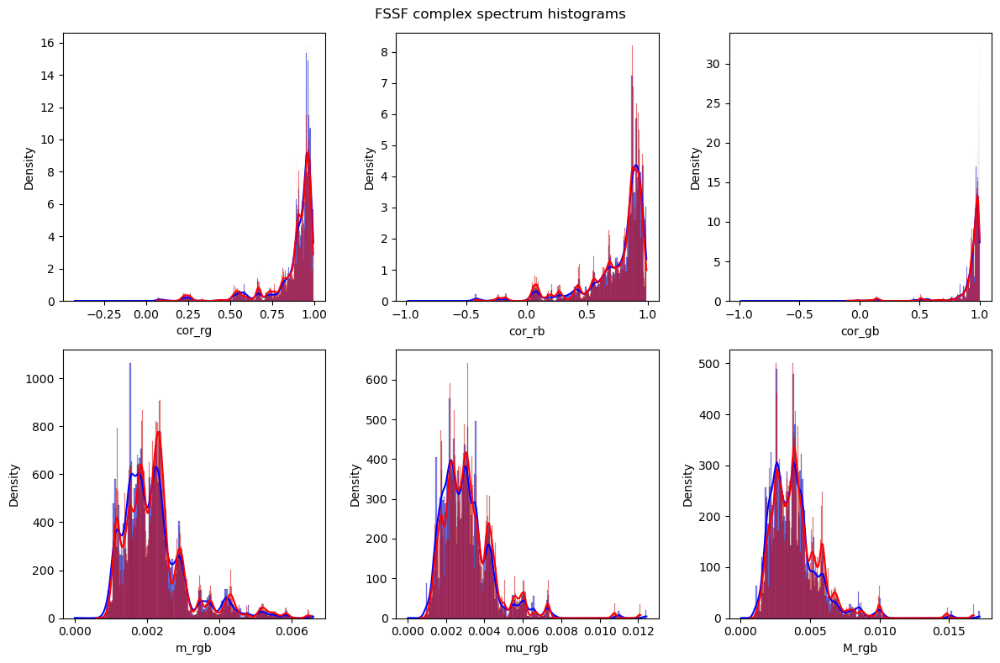

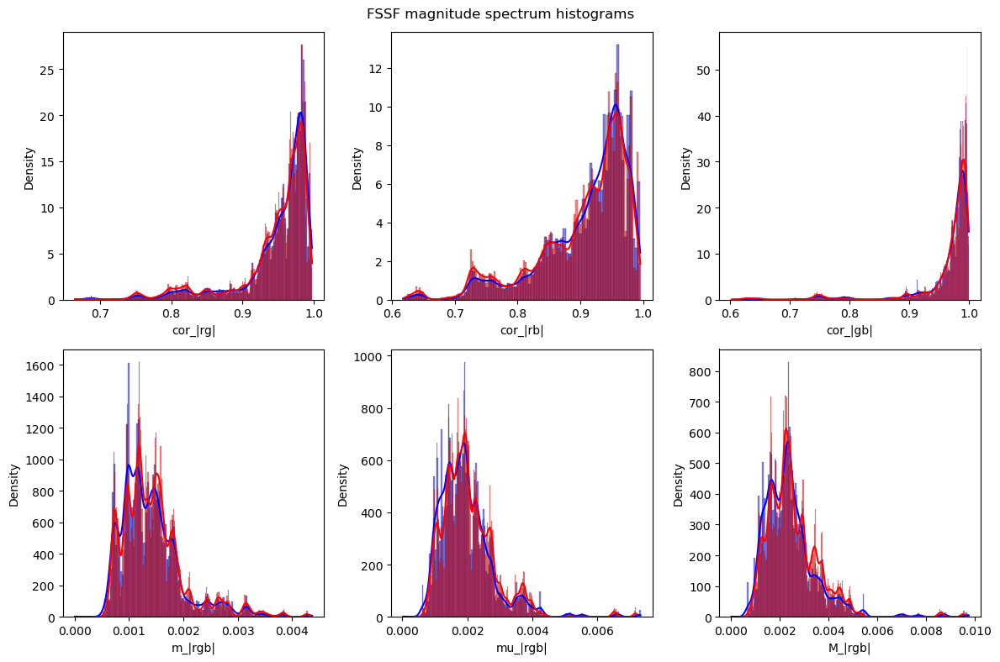

In [8]:
image_spectral_data_real = image_spectral_data[image_spectral_data['label']==0]
display(image_spectral_data_real.describe())
print()
image_spectral_data_fake = image_spectral_data[image_spectral_data['label']==1]
display(image_spectral_data_fake.describe())
hist12([image_spectral_data_real, image_spectral_data_fake])

In [9]:
#face_gen = FACE_gen(imag_path)
#facial_spectral_data = spec_feat_extr(face_gen)
#facial_spectral_data.dropna(inplace=True)
#facial_spectral_data.to_csv('facial_spectral_statistics.csv',index=False)
facial_spectral_data.describe()

,cor_rg,cor_rb,cor_gb,m_rgb,mu_rgb,M_rgb,cor_|rg|,cor_|rb|,cor_|gb|,m_|rgb|,mu_|rgb|,M_|rgb|,label
count,370502.000000,370502.000000,370502.000000,370502.000000,370502.000000,370502.000000,370502.000000,370502.000000,370502.000000,370502.000000,370502.000000,370502.000000,370502.000000
mean,0.929284,0.859188,0.953257,0.010838,0.017025,0.022031,0.967893,0.938529,0.977787,0.007142,0.012073,0.015804,0.837796
std,0.111979,0.199483,0.103787,0.007765,0.012544,0.017433,0.039523,0.074213,0.039898,0.005335,0.008877,0.012220,0.368639
min,-0.618096,-0.641679,-0.171306,0.001590,0.002783,0.003029,0.462901,0.372711,0.485942,0.001129,0.001781,0.001930,0.000000
25%,0.925722,0.853291,0.966132,0.006854,0.010218,0.012750,0.962428,0.926702,0.980101,0.004435,0.007384,0.009480,1.000000
50%,0.968766,0.939765,0.983261,0.008548,0.013634,0.017314,0.982940,0.967262,0.991245,0.005645,0.009886,0.012793,1.000000
75%,0.981911,0.967408,0.990029,0.012009,0.019541,0.025267,0.990300,0.982044,0.994693,0.007897,0.013965,0.018105,1.000000
max,0.999943,0.999920,0.999894,0.316819,0.393781,0.497576,0.999969,0.999954,0.999929,0.221344,0.278725,0.364848,1.000000


,cor_rg,cor_rb,cor_gb,m_rgb,mu_rgb,M_rgb,cor_|rg|,cor_|rb|,cor_|gb|,m_|rgb|,mu_|rgb|,M_|rgb|,label
count,60097.000000,60097.000000,60097.000000,60097.000000,60097.000000,60097.000000,60097.000000,60097.000000,60097.000000,60097.000000,60097.000000,60097.000000,60097.0
mean,0.934586,0.871615,0.957594,0.010910,0.016767,0.021571,0.968871,0.941182,0.979389,0.007241,0.011796,0.015346,0.0
std,0.098672,0.182075,0.097054,0.008872,0.013654,0.018821,0.037133,0.070758,0.038421,0.006193,0.009512,0.012971,0.0
min,-0.523653,-0.555921,-0.099273,0.001590,0.002783,0.003029,0.477428,0.386861,0.561489,0.001129,0.001781,0.001930,0.0
25%,0.927432,0.870683,0.970115,0.006707,0.010069,0.012497,0.963180,0.930641,0.982808,0.004370,0.007172,0.009096,0.0
50%,0.969534,0.940951,0.985382,0.008593,0.013482,0.016967,0.983142,0.968125,0.992184,0.005674,0.009593,0.012343,0.0
75%,0.981536,0.969083,0.991427,0.012226,0.019390,0.024793,0.989993,0.982478,0.995405,0.008117,0.013581,0.017430,0.0
max,0.999943,0.999920,0.999894,0.316819,0.393781,0.497576,0.999969,0.999954,0.999929,0.221344,0.278725,0.364848,0.0


,cor_rg,cor_rb,cor_gb,m_rgb,mu_rgb,M_rgb,cor_|rg|,cor_|rb|,cor_|gb|,m_|rgb|,mu_|rgb|,M_|rgb|,label
count,310405.000000,310405.000000,310405.000000,310405.000000,310405.000000,310405.000000,310405.000000,310405.000000,310405.000000,310405.000000,310405.000000,310405.000000,310405.0
mean,0.928257,0.856782,0.952417,0.010824,0.017075,0.022119,0.967704,0.938015,0.977477,0.007123,0.012127,0.015893,1.0
std,0.114348,0.202593,0.105020,0.007532,0.012317,0.017149,0.039966,0.074853,0.040171,0.005153,0.008747,0.012067,0.0
min,-0.618096,-0.641679,-0.171306,0.002200,0.002950,0.003288,0.462901,0.372711,0.485942,0.001414,0.001908,0.002076,1.0
25%,0.925407,0.849274,0.965491,0.006881,0.010248,0.012799,0.962281,0.925824,0.979625,0.004447,0.007420,0.009554,1.0
50%,0.968597,0.939595,0.982864,0.008541,0.013664,0.017372,0.982895,0.967126,0.991040,0.005640,0.009933,0.012870,1.0
75%,0.981989,0.967106,0.989742,0.011969,0.019575,0.025358,0.990375,0.981977,0.994547,0.007846,0.014055,0.018284,1.0
max,0.999938,0.999670,0.999679,0.201348,0.274011,0.383188,0.999966,0.999829,0.999847,0.136536,0.233518,0.333297,1.0


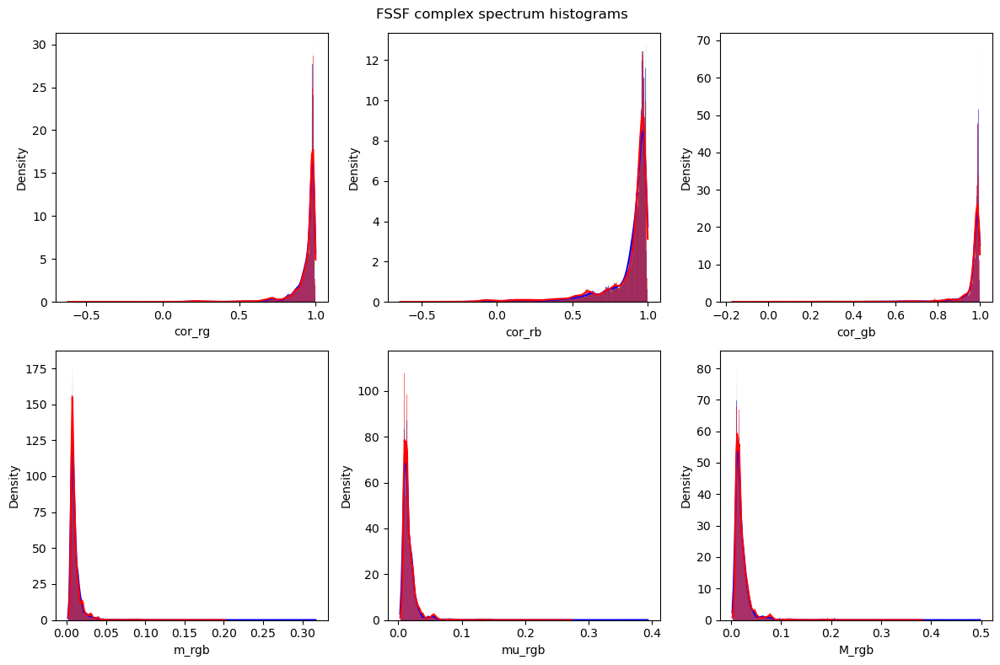

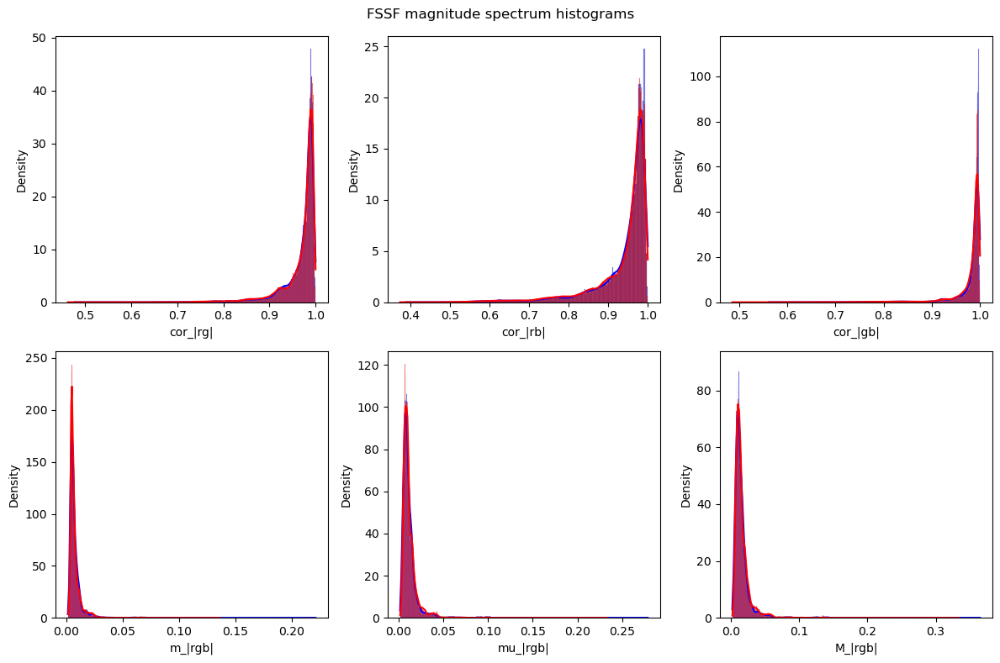

In [10]:
facial_spectral_data_real = facial_spectral_data[facial_spectral_data['label']==0]
display(facial_spectral_data_real.describe())
print()
facial_spectral_data_fake = facial_spectral_data[facial_spectral_data['label']==1]
display(facial_spectral_data_fake.describe())
hist12([facial_spectral_data_real, facial_spectral_data_fake])

In [11]:
#bkgd_gen = BKGD_gen(imag_path)
#background_spectral_data = spec_feat_extr(bkgd_gen)
#background_spectral_data.dropna(inplace=True)
#background_spectral_data.to_csv('background_spectral_statistics.csv',index=False)
background_spectral_data.describe()

,cor_rg,cor_rb,cor_gb,m_rgb,mu_rgb,M_rgb,cor_|rg|,cor_|rb|,cor_|gb|,m_|rgb|,mu_|rgb|,M_|rgb|,label
count,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000
mean,0.859271,0.773925,0.892918,0.008519,0.013204,0.017299,0.954060,0.928496,0.959627,0.005680,0.009091,0.011927,0.837926
std,0.294692,0.357018,0.236382,0.007760,0.013446,0.018991,0.069799,0.083804,0.072500,0.005381,0.009560,0.013395,0.368519
min,-1.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000851,-0.057720,-0.002534,0.000000,0.000000,0.000000,0.000000
25%,0.883753,0.762893,0.917886,0.004286,0.005727,0.006861,0.946756,0.904507,0.960480,0.002734,0.003835,0.004619,1.000000
50%,0.964003,0.916709,0.973387,0.006640,0.009566,0.012074,0.981674,0.959583,0.986438,0.004381,0.006547,0.008327,1.000000
75%,0.988408,0.972532,0.991079,0.010194,0.015982,0.020956,0.993969,0.986062,0.995606,0.006831,0.011091,0.014533,1.000000
max,1.000000,1.000000,1.000000,0.281212,0.460778,0.669756,1.000000,1.000000,1.000000,0.160731,0.392417,0.574637,1.000000


Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
2.0 min 9 per 1000 images, 56k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a b

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
2.0 min 0 per 1000 images, 64k images complete
2.0 min 22 per 1000 images, 65k images complete
3.0 min 3 per 1000 images, 66k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a back

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

2.0 min 46 per 1000 images, 87k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a 

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
1.0 min 9 per 1000 images, 108k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a 

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
1.0 min 28 per 1000 images, 151k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
1.0 min 43 per 1000 images, 158k images complete
1.0 min 36 per 1000 images, 159k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
1.0 min 38 per 1000 images, 162k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
1.0 min 42 per 1000 images, 163k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
1.0 min 57 per 1000 images, 164k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

1.0 min 31 per 1000 images, 171k images complete
1.0 min 35 per 1000 images, 172k images complete
1.0 min 30 per 1000 images, 173k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
1.0 min 29 per 1000 images, 174k images complete
1.0 min 27 per 1000 images, 175k images complete
1.0 min 35 per 1000 images, 176k images complete
Failed to retrieve a background in 1000 attempts
1.0 min 47 per 1000 images, 177k images complete
1.0 min 35 per 1000 images, 178k images complete
1.0 min 27 per 1000 images, 179k images complete
1.0 min 33 per 1000 images, 180k images complete
Failed to retrieve a background in 1000 attempts
1.0 min 43 per 1000 images, 181k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

2.0 min 24 per 1000 images, 317k images complete
2.0 min 22 per 1000 images, 318k images complete
2.0 min 25 per 1000 images, 319k images complete
1.0 min 57 per 1000 images, 320k images complete
2.0 min 11 per 1000 images, 321k images complete
2.0 min 15 per 1000 images, 322k images complete
2.0 min 16 per 1000 images, 323k images complete
2.0 min 30 per 1000 images, 324k images complete
2.0 min 30 per 1000 images, 325k images complete
2.0 min 2 per 1000 images, 326k images complete
2.0 min 33 per 1000 images, 327k images complete
1.0 min 59 per 1000 images, 328k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a 

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
1.0 min 22 per 1000 images, 343k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

Failed to retrieve a background in 1000 attempts
1.0 min 59 per 1000 images, 348k images complete
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a background in 1000 attempts
Failed to retrieve a

2.0 min 48 per 1000 images, 371k images complete
2.0 min 24 per 1000 images, 372k images complete
2.0 min 40 per 1000 images, 373k images complete
3.0 min 11 per 1000 images, 374k images complete
Total run time 13.0 hours 40.0 minutes 34 seconds


,cor_rg,cor_rb,cor_gb,m_rgb,mu_rgb,M_rgb,cor_|rg|,cor_|rb|,cor_|gb|,m_|rgb|,mu_|rgb|,M_|rgb|,label
count,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000,355356.000000
mean,0.859271,0.773925,0.892918,0.008519,0.013204,0.017299,0.954060,0.928496,0.959627,0.005680,0.009091,0.011927,0.837926
std,0.294692,0.357018,0.236382,0.007760,0.013446,0.018991,0.069799,0.083804,0.072500,0.005381,0.009560,0.013395,0.368519
min,-1.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000851,-0.057720,-0.002534,0.000000,0.000000,0.000000,0.000000
25%,0.883753,0.762893,0.917886,0.004286,0.005727,0.006861,0.946756,0.904507,0.960480,0.002734,0.003835,0.004619,1.000000
50%,0.964003,0.916709,0.973387,0.006640,0.009566,0.012074,0.981674,0.959583,0.986438,0.004381,0.006547,0.008327,1.000000
75%,0.988408,0.972532,0.991079,0.010194,0.015982,0.020956,0.993969,0.986062,0.995606,0.006831,0.011091,0.014533,1.000000
max,1.000000,1.000000,1.000000,0.281212,0.460778,0.669756,1.000000,1.000000,1.000000,0.160731,0.392417,0.574637,1.000000


,cor_rg,cor_rb,cor_gb,m_rgb,mu_rgb,M_rgb,cor_|rg|,cor_|rb|,cor_|gb|,m_|rgb|,mu_|rgb|,M_|rgb|,label
count,57594.000000,57594.000000,57594.000000,57594.000000,57594.000000,57594.000000,57594.000000,57594.000000,57594.000000,57594.000000,57594.000000,57594.000000,57594.0
mean,0.873632,0.781972,0.883733,0.008463,0.013004,0.017002,0.956495,0.929140,0.958158,0.005650,0.008930,0.011691,0.0
std,0.267123,0.341089,0.254384,0.008208,0.014157,0.019981,0.069081,0.083084,0.073171,0.005758,0.009979,0.013929,0.0
min,-0.972218,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.049702,-0.057720,-0.002534,0.000000,0.000000,0.000000,0.0
25%,0.893701,0.770742,0.909579,0.004169,0.005532,0.006612,0.950805,0.905203,0.957780,0.002653,0.003686,0.004418,0.0
50%,0.966847,0.916573,0.971738,0.006547,0.009313,0.011678,0.983219,0.959722,0.985738,0.004319,0.006339,0.008027,0.0
75%,0.988869,0.972419,0.990656,0.010094,0.015818,0.020690,0.994264,0.986166,0.995400,0.006795,0.010952,0.014348,0.0
max,1.000000,1.000000,1.000000,0.264746,0.421878,0.620589,1.000000,1.000000,1.000000,0.160731,0.299542,0.438302,0.0


,cor_rg,cor_rb,cor_gb,m_rgb,mu_rgb,M_rgb,cor_|rg|,cor_|rb|,cor_|gb|,m_|rgb|,mu_|rgb|,M_|rgb|,label
count,297762.000000,297762.000000,297762.000000,297762.000000,297762.000000,297762.000000,297762.000000,297762.000000,297762.000000,297762.000000,297762.000000,297762.000000,297762.0
mean,0.856494,0.772369,0.894695,0.008530,0.013243,0.017356,0.953589,0.928371,0.959912,0.005686,0.009122,0.011973,1.0
std,0.299653,0.359998,0.232698,0.007670,0.013304,0.018793,0.069927,0.083942,0.072366,0.005305,0.009477,0.013288,0.0
min,-1.000000,-0.996554,-1.000000,0.000000,0.000000,0.000000,0.000851,0.003579,0.000609,0.000000,0.000000,0.000000,1.0
25%,0.881581,0.761145,0.919567,0.004310,0.005767,0.006914,0.946031,0.904360,0.960959,0.002749,0.003868,0.004665,1.0
50%,0.963438,0.916731,0.973708,0.006657,0.009613,0.012148,0.981340,0.959551,0.986569,0.004393,0.006585,0.008382,1.0
75%,0.988313,0.972553,0.991158,0.010212,0.016011,0.021000,0.993904,0.986038,0.995648,0.006838,0.011115,0.014564,1.0
max,1.000000,1.000000,1.000000,0.281212,0.460778,0.669756,1.000000,1.000000,1.000000,0.147285,0.392417,0.574637,1.0


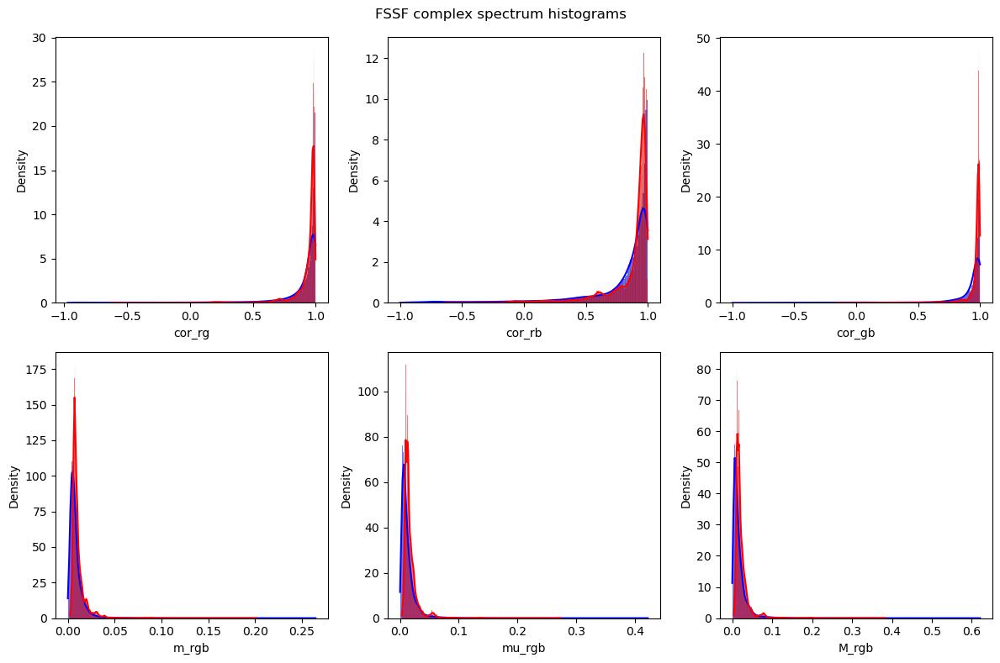

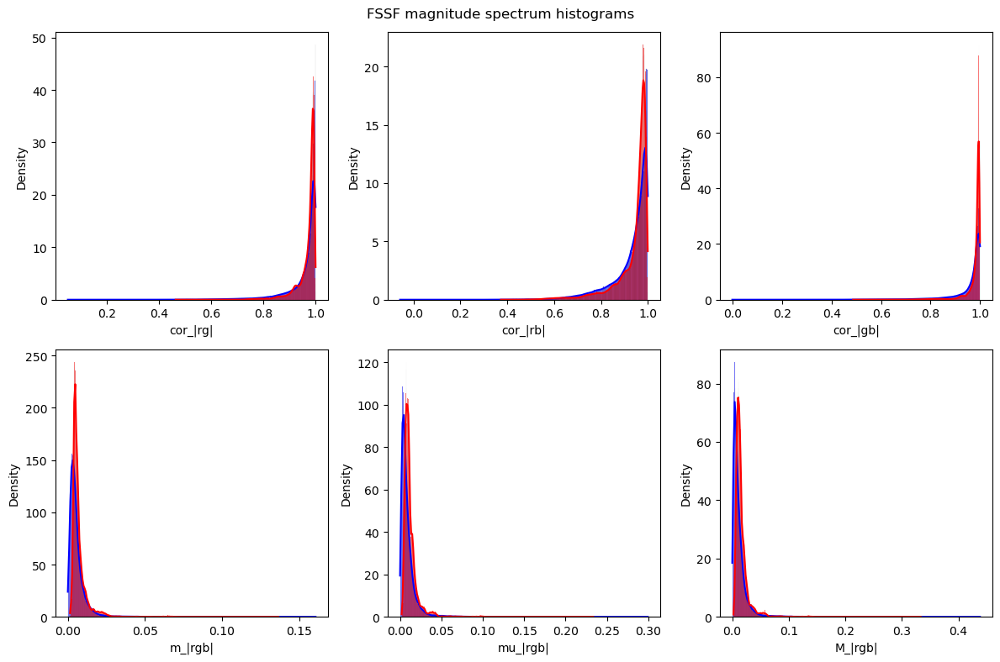

In [12]:
background_spectral_data_real = background_spectral_data[background_spectral_data['label']==0]
display(background_spectral_data_real.describe())
print()
background_spectral_data_fake = background_spectral_data[background_spectral_data['label']==1]
display(background_spectral_data_fake.describe())
hist12([background_spectral_data_real, facial_spectral_data_fake])

Looking at our histograms it seems that it is not going to be as easy as Amin et al would have it seem. There is large overlap between the real (blue) and fake (red) distributions indicating that it will be very difficult to sus out the real from fake images using spectral methods. However before throwing in the towel we will analyze these datasets in an effort to seperate them.

Additionally we still have yet to try spectral forensics on face vs background as suggested by Amin et al, and time-space spectral methods which are a natural extension of Amin et al.

Dimensionality reduction tests: Image FSSF
Data scaling: 0 sec
Figure(2000x500)
Prinical Component Analysis (PCA): 2 sec
Subsampling: 0 sec
Figure(2000x500)
Kernel PCA Polynomial: 5395 sec
Figure(2000x500)
Kernel PCA Radial Basis Function (RBF): 5407 sec
Figure(2000x500)
Kernel PCA Cosine: 5386 sec
Figure(2000x500)
Manifold learning Isomap: 206 sec
Figure(2000x500)
Manifold learning Spectral Embedding: 807 sec
Figure(2000x500)
Manifold learning t-distributed Stochastic Neighbor Embedding (t-SNE): 216 sec
VAE(
  (encoder): Sequential(
    (0): Linear(in_features=12, out_features=9, bias=True)
    (1): BatchNorm1d(9, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=9, out_features=7, bias=True)
    (5): BatchNorm1d(7, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0.5, inplace=False)
    (8): Linear(in_features=7, out_features=5, bias=True)

Epoch:   0%|▏                                                                                  | 1/500 [00:00<?, ?it/s]

VAE training started:


Epoch: 501it [56:09,  6.74s/it, training loss=0.77, validation loss=0.71, best validation loss=0.703]                  


VAE training 500 epochs complete.


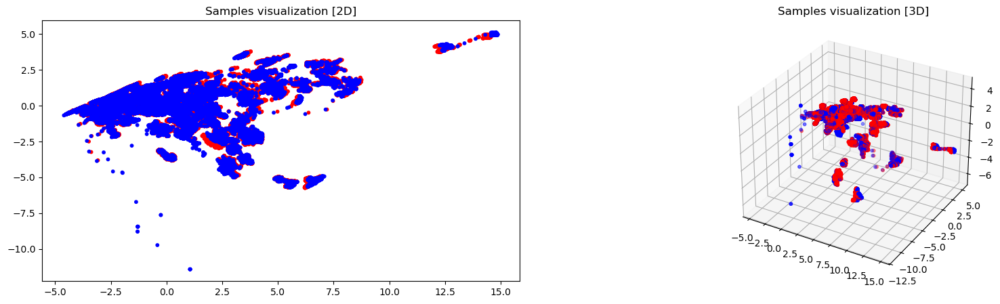

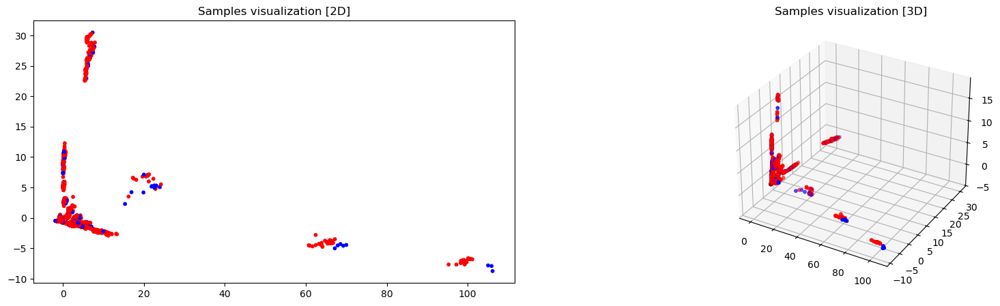

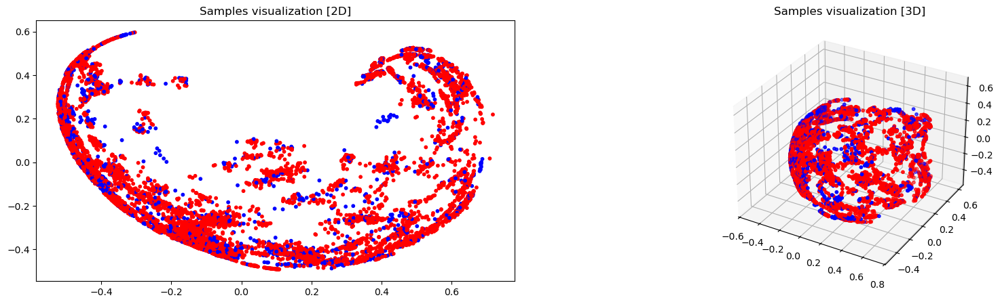

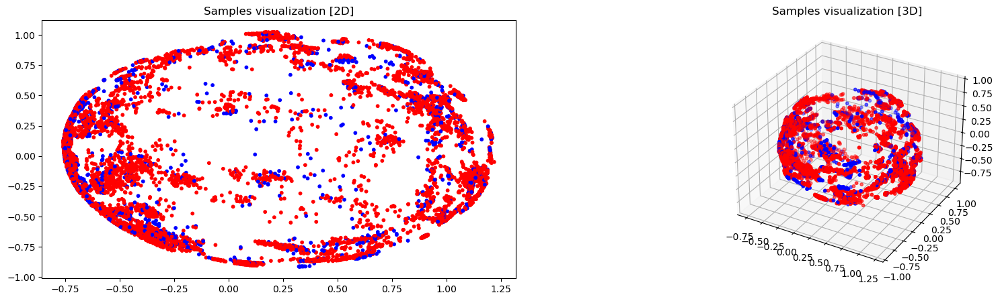

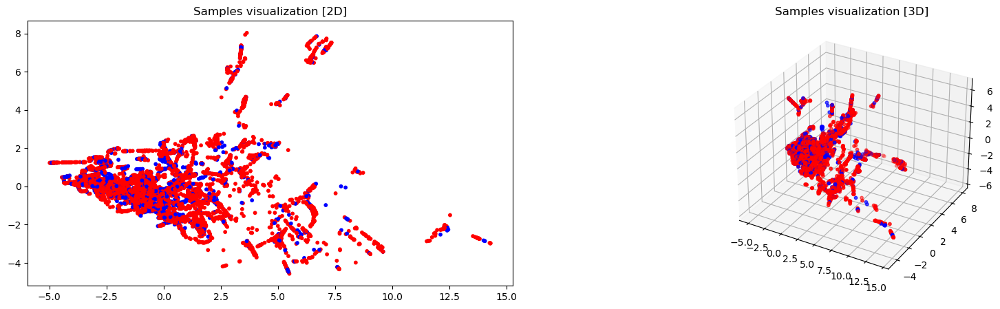

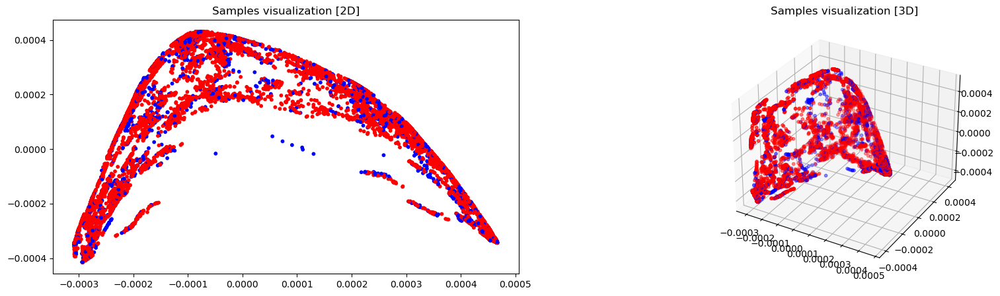

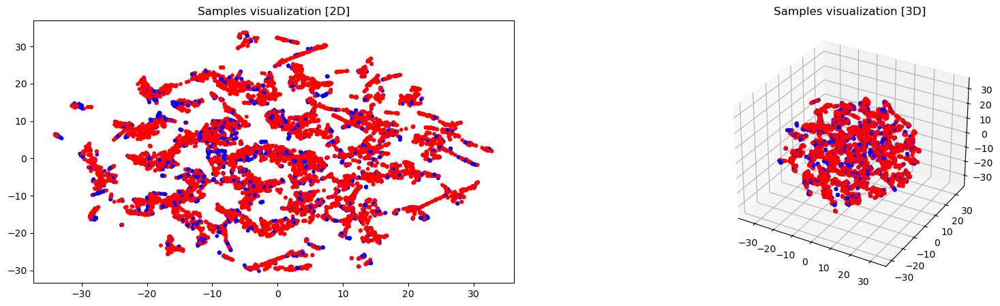

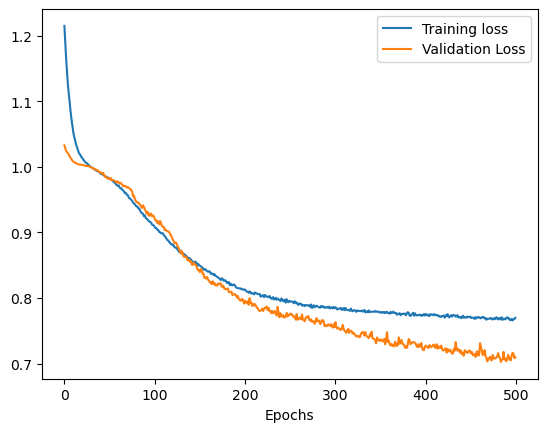

Figure(2000x500)
Variational Autoencoder (VAE): 3401 sec
Dimensionality reduction tests complete: 347.0 min 3


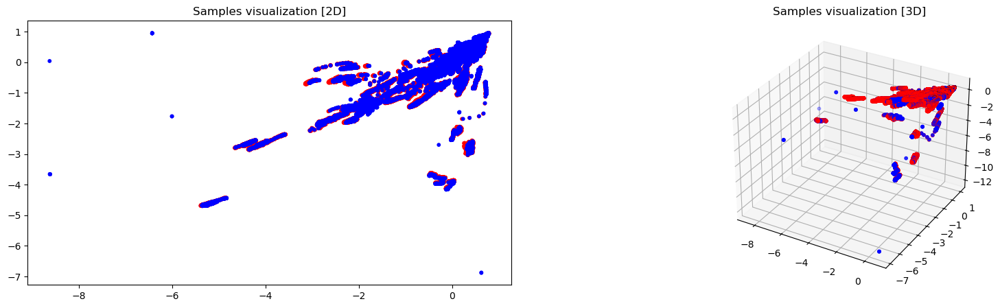

In [13]:
dim_red_tests(image_spectral_data, data_type='Image FSSF', model_path='VAE_model_image')

Dimensionality reduction tests: Facial FSSF
Data scaling: 0 sec
Figure(2000x500)
Prinical Component Analysis (PCA): 2 sec
Subsampling: 0 sec
Figure(2000x500)
Kernel PCA Polynomial: 5368 sec
Figure(2000x500)
Kernel PCA Radial Basis Function (RBF): 5361 sec
Figure(2000x500)
Kernel PCA Cosine: 5337 sec
Figure(2000x500)
Manifold learning Isomap: 145 sec
Figure(2000x500)
Manifold learning Spectral Embedding: 813 sec
Figure(2000x500)
Manifold learning t-distributed Stochastic Neighbor Embedding (t-SNE): 269 sec
VAE(
  (encoder): Sequential(
    (0): Linear(in_features=12, out_features=9, bias=True)
    (1): BatchNorm1d(9, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=9, out_features=7, bias=True)
    (5): BatchNorm1d(7, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0.5, inplace=False)
    (8): Linear(in_features=7, out_features=5, bias=True

Epoch:   0%|▏                                                                                  | 1/500 [00:00<?, ?it/s]

VAE training started:


Epoch: 501it [55:32,  6.66s/it, training loss=0.792, validation loss=0.758, best validation loss=0.752]                


VAE training 500 epochs complete.


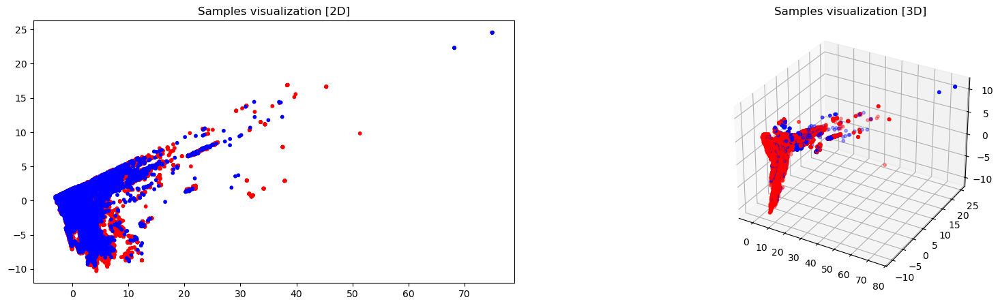

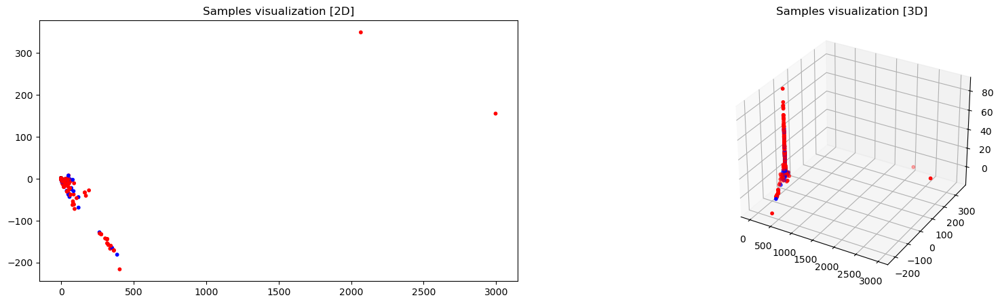

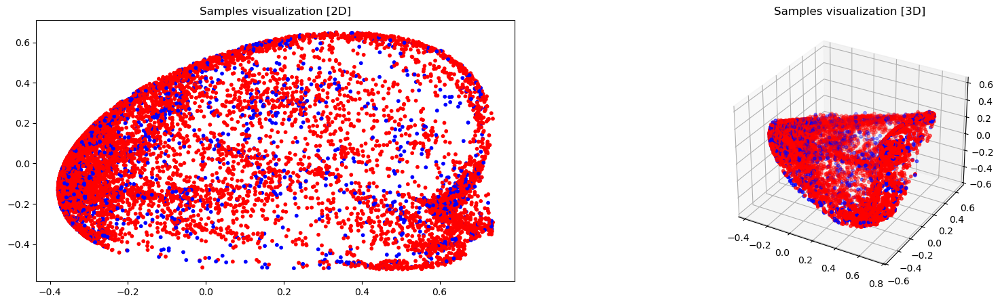

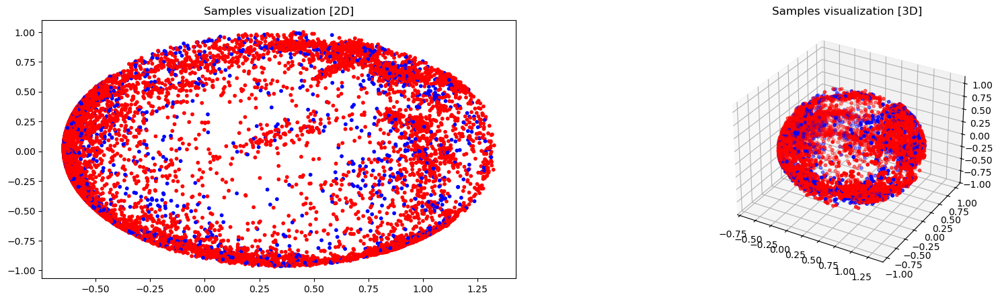

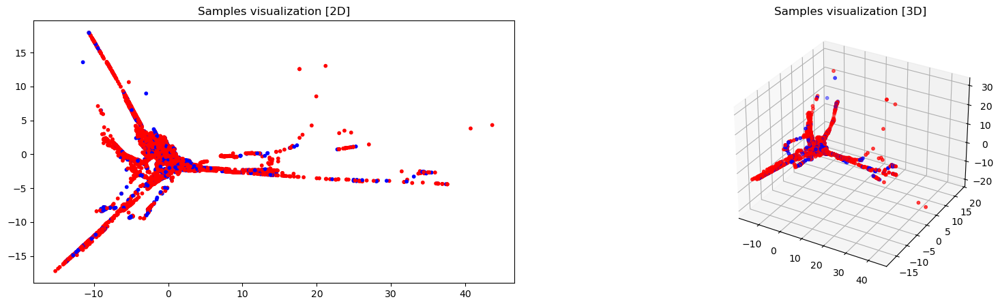

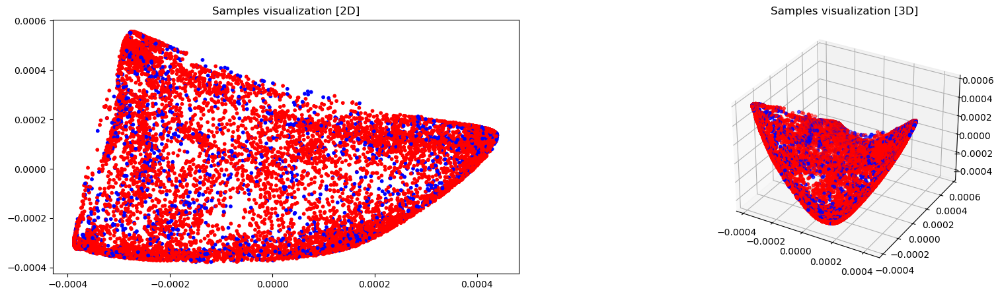

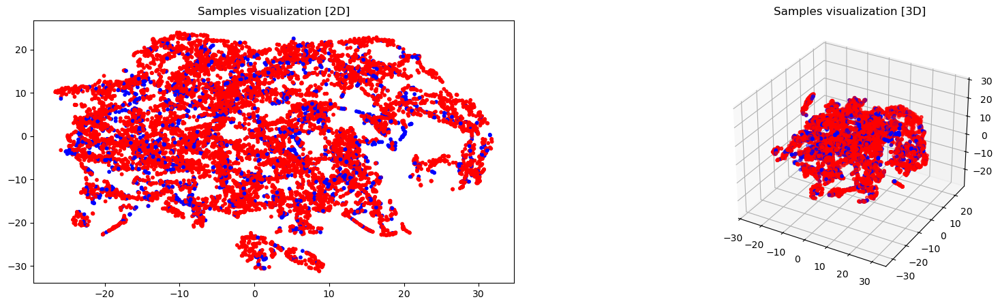

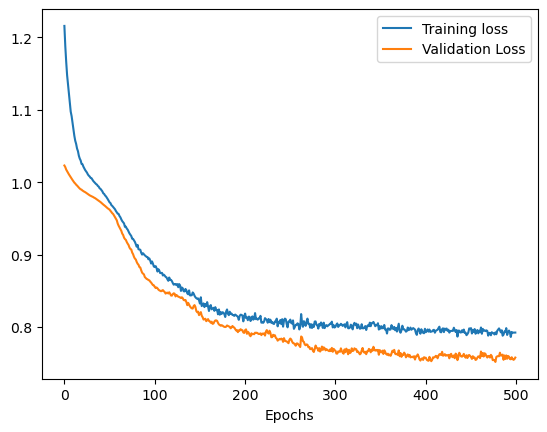

Figure(2000x500)
Variational Autoencoder (VAE): 3364 sec
Dimensionality reduction tests complete: 344.0 min 23


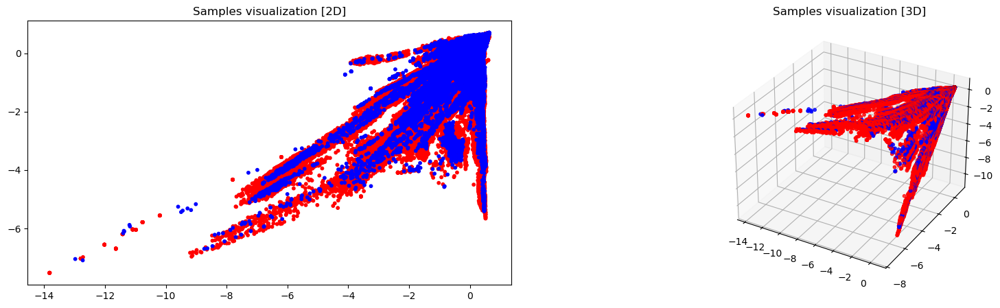

In [14]:
dim_red_tests(facial_spectral_data, data_type='Facial FSSF', model_path='VAE_model_facial')

Dimensionality reduction tests: Background FSSF
Data scaling: 0 sec
Figure(2000x500)
Prinical Component Analysis (PCA): 2 sec
Subsampling: 0 sec
Figure(2000x500)
Kernel PCA Polynomial: 5351 sec
Figure(2000x500)
Kernel PCA Radial Basis Function (RBF): 5358 sec
Figure(2000x500)
Kernel PCA Cosine: 5334 sec
Figure(2000x500)
Manifold learning Isomap: 151 sec
Figure(2000x500)
Manifold learning Spectral Embedding: 798 sec
Figure(2000x500)
Manifold learning t-distributed Stochastic Neighbor Embedding (t-SNE): 413 sec
VAE(
  (encoder): Sequential(
    (0): Linear(in_features=12, out_features=9, bias=True)
    (1): BatchNorm1d(9, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=9, out_features=7, bias=True)
    (5): BatchNorm1d(7, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0.5, inplace=False)
    (8): Linear(in_features=7, out_features=5, bias=

Epoch:   0%|▏                                                                                  | 1/500 [00:00<?, ?it/s]

VAE training started:


Epoch: 501it [53:53,  6.47s/it, training loss=0.807, validation loss=0.731, best validation loss=0.726]                


VAE training 500 epochs complete.


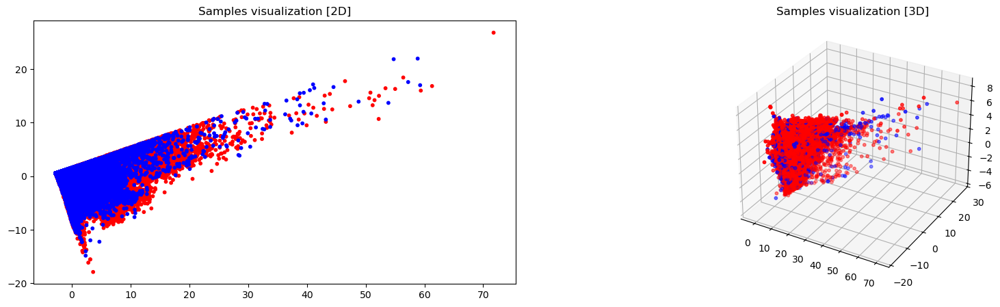

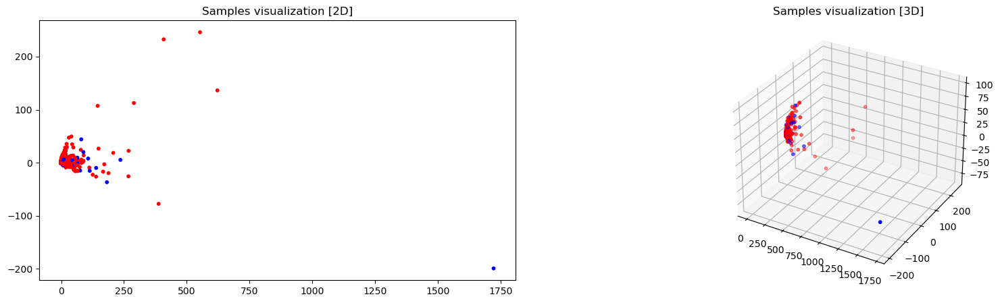

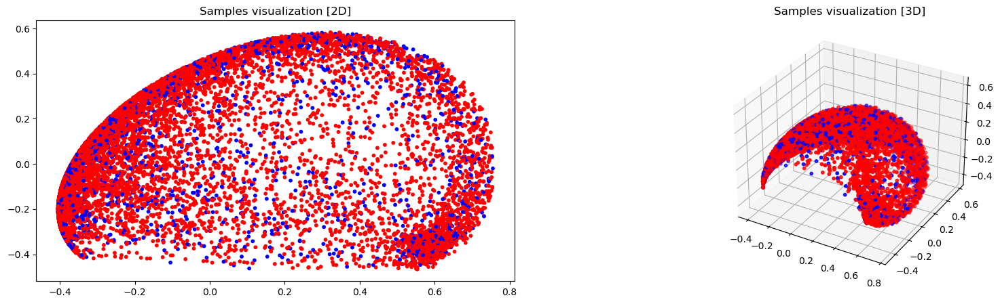

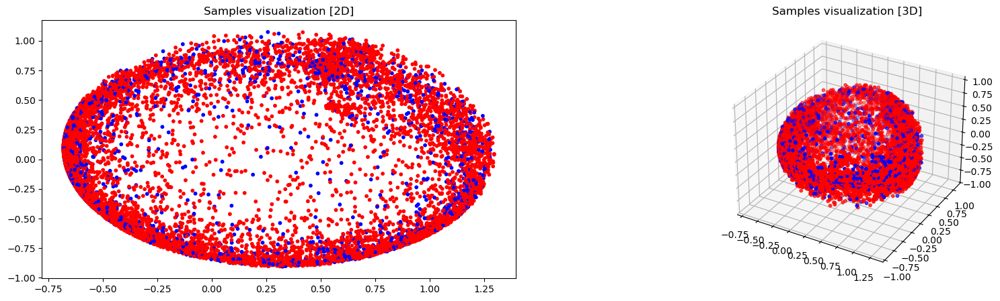

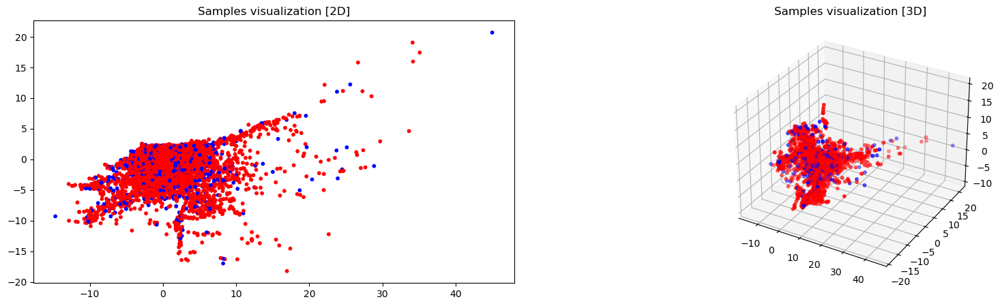

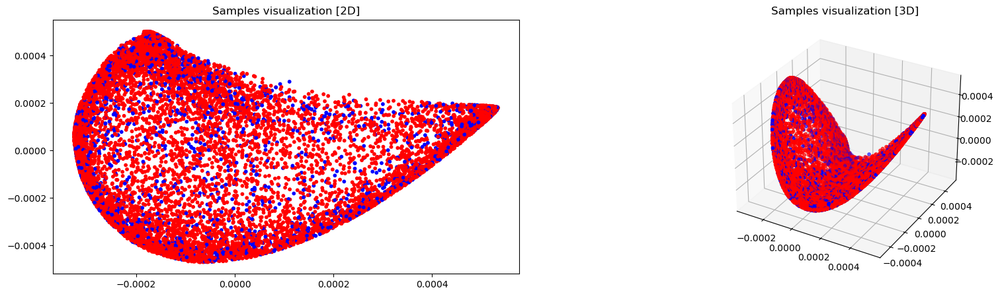

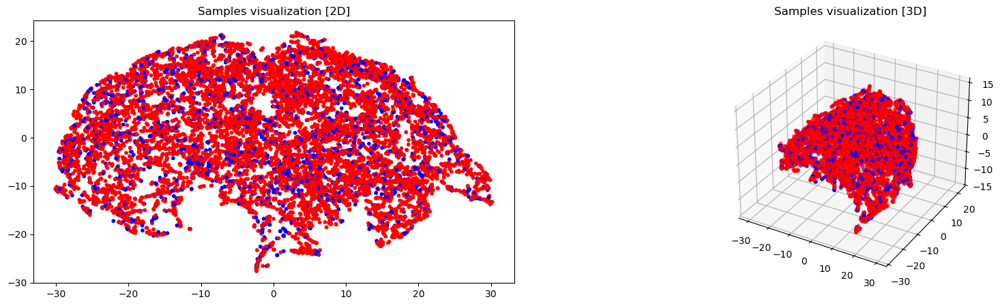

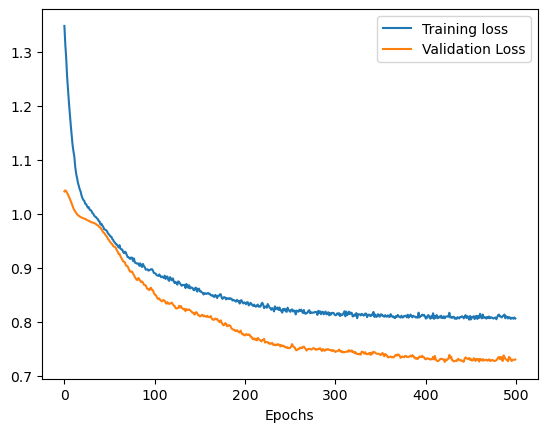

Figure(2000x500)
Variational Autoencoder (VAE): 3264 sec
Dimensionality reduction tests complete: 344.0 min 34


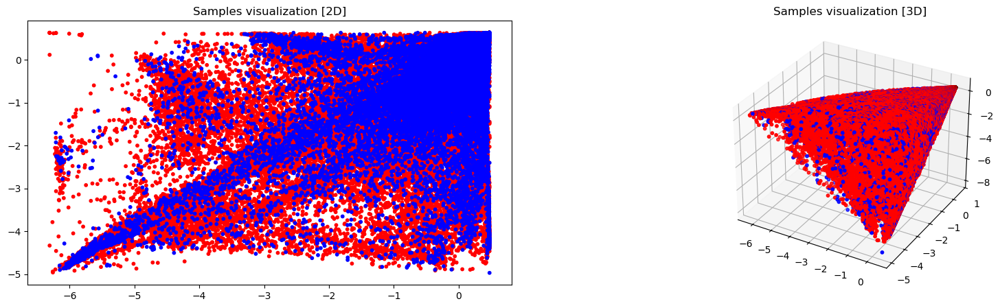

In [15]:
dim_red_tests(background_spectral_data, data_type='Background FSSF', model_path='VAE_model_background')

From the histograms and PCA compressed scatter plots it is clear that we have our work cut out for us. The real and fake data are right on top of each other. To perform kernel PCA we have subsample our dataset for memory constraints as the dataset size of 374369 will take 1.02 TB of memory. Some ball park math suggests that 12000 will take 1 GB.

Because each of the standard dimensionality reduction techniques resulted in highly mized data, we will train a Variational Auto Encoder (VAE) in an effort to salvage an unsupervised approach. Note that Amin et al uses a Gaussian Mixing Model (GMM) to find two clusters (fake and real) before entering a supervised learing state. Due to the highly correlated likelyhood functions (shown by the real/fake histograms above) this is likely to end up poorly.

Based on our VAE performance, and other dimensionality reduction techniques it is clear that our feature set - as it is currently used - can not reasonably determine real from fake image. We will explore the proposed techniques on faces and background images by use of a facial extractor tool, then explore temporal techniques to see if performance can be improved.

In [63]:
os.chdir('D:/Project')
real_path = 'Celeb-DF/Celeb-real'
fake_path = 'Celeb-DF/Celeb-synthesis'
imag_path = 'Celeb-DF/Images'
if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

real_video_gen = VID_gen(real_path, 0)
fake_video_gen = VID_gen(fake_path, 1)

In [71]:
#video_spectral_data = spec_feat_extr_video([real_video_gen, fake_video_gen], 'video_spectral_statistics_running.csv')
#video_spectral_data.dropna(inplace=True)
#video_spectral_data.to_csv('video_spectral_statistics.csv',index=False)
video_spectral_data.describe()

,cor_tf_rg,cor_tf_rb,cor_tf_gb,m_tf_rgb,mu_tf_rgb,M_tf_rgb,cor_tf_|rg|,cor_tf_|rb|,cor_tf_|gb|,m_tf_|rgb|,...,m_ff_rgb,mu_ff_rgb,M_ff_rgb,cor_ff_|rg|,cor_ff_|rb|,cor_ff_|gb|,m_ff_|rgb|,mu_ff_|rgb|,M_ff_|rgb|,label
count,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,...,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000
mean,0.936007,0.868687,0.960227,616.604499,887.880591,1133.988502,0.951733,0.914307,0.967705,558.749845,...,6013.621878,7688.889652,9149.270465,0.951943,0.915021,0.967693,5356.213673,6670.074007,7762.270535,0.165792
std,0.078355,0.144522,0.074608,263.217237,376.005053,510.004963,0.050248,0.081505,0.056015,226.674740,...,2072.955357,2709.564688,3482.701107,0.049925,0.080779,0.056905,1779.260438,2217.167381,2721.153855,0.372089
min,0.585591,0.269890,0.415131,219.302660,281.307500,339.529360,0.776988,0.590888,0.589913,196.187060,...,2764.464000,3185.334700,3552.199700,0.756737,0.602013,0.577964,2433.653800,2774.119100,3066.639000,0.000000
25%,0.926318,0.840131,0.956742,417.921750,597.530800,762.143000,0.939518,0.885800,0.966566,390.298300,...,4696.505000,5781.702600,6649.477500,0.937827,0.885404,0.966014,4201.978000,5104.017600,5779.216300,0.000000
50%,0.965418,0.924583,0.981179,581.394700,824.306150,1044.260700,0.970171,0.939142,0.983431,531.948240,...,5610.124000,7396.821000,8586.590000,0.969851,0.938638,0.983461,5053.898400,6427.748000,7429.607400,0.000000
75%,0.983158,0.962130,0.991479,761.787000,1128.740400,1427.857300,0.985429,0.971307,0.991946,695.620360,...,7015.496600,8964.095000,10636.071000,0.985557,0.971489,0.992293,6237.081500,7820.457500,9000.510000,0.000000
max,0.998520,0.997213,0.999717,1736.920400,2673.025100,3583.501000,0.998605,0.997378,0.999725,1531.355000,...,13497.270000,16947.725000,22893.705000,0.998572,0.997554,0.999733,11791.772000,14528.148000,18731.596000,1.000000


In [70]:
video_spectral_data = pd.read_csv('video_spectral_statistics.csv')
video_spectral_data_real = video_spectral_data[video_spectral_data['label']==0]
video_spectral_data_fake = video_spectral_data[video_spectral_data['label']==1]

,cor_tf_rg,cor_tf_rb,cor_tf_gb,m_tf_rgb,mu_tf_rgb,M_tf_rgb,cor_tf_|rg|,cor_tf_|rb|,cor_tf_|gb|,m_tf_|rgb|,...,m_ff_rgb,mu_ff_rgb,M_ff_rgb,cor_ff_|rg|,cor_ff_|rb|,cor_ff_|gb|,m_ff_|rgb|,mu_ff_|rgb|,M_ff_|rgb|,label
count,795.000000,795.000000,795.000000,795.000000,795.000000,795.000000,795.000000,795.000000,795.000000,795.000000,...,795.000000,795.000000,795.000000,795.000000,795.000000,795.000000,795.000000,795.000000,795.000000,795.0
mean,0.934138,0.865055,0.959326,616.078967,889.465715,1137.463100,0.950471,0.912356,0.967022,558.127572,...,6014.284862,7707.124479,9187.851752,0.950696,0.913036,0.966966,5357.342175,6684.666607,7790.765331,0.0
std,0.079894,0.147235,0.076270,262.124399,373.887313,507.865086,0.051087,0.082845,0.057255,225.779309,...,2085.433094,2725.490492,3508.334962,0.050749,0.082210,0.058271,1791.013363,2232.180628,2743.166250,0.0
min,0.585689,0.269890,0.415131,222.328740,281.307500,339.529360,0.776988,0.591049,0.589913,198.541000,...,2764.464000,3185.334700,3552.199700,0.756737,0.602102,0.577964,2433.653800,2774.119100,3066.639000,0.0
25%,0.925017,0.824418,0.955373,416.878310,596.467530,762.457600,0.938800,0.884646,0.966324,389.442455,...,4667.267650,5778.903800,6650.462650,0.934991,0.883764,0.965772,4192.472500,5108.431300,5785.597850,0.0
50%,0.964684,0.923477,0.980805,585.462700,828.820000,1048.491500,0.969369,0.937168,0.983138,533.658450,...,5604.683600,7441.383000,8613.336000,0.969166,0.936972,0.983204,5052.707000,6465.316400,7448.667000,0.0
75%,0.982465,0.961238,0.991086,762.274445,1130.049400,1428.282700,0.984935,0.971119,0.991821,697.281930,...,7047.628300,8972.128000,10697.223000,0.985024,0.971179,0.992063,6248.288500,7868.351500,9033.093500,0.0
max,0.998520,0.997213,0.999717,1736.920400,2198.114500,3022.320800,0.998605,0.997378,0.999725,1531.355000,...,13327.894000,16776.703000,22676.418000,0.998572,0.997554,0.999733,11663.755000,14477.121000,18718.848000,0.0


,cor_tf_rg,cor_tf_rb,cor_tf_gb,m_tf_rgb,mu_tf_rgb,M_tf_rgb,cor_tf_|rg|,cor_tf_|rb|,cor_tf_|gb|,m_tf_|rgb|,...,m_ff_rgb,mu_ff_rgb,M_ff_rgb,cor_ff_|rg|,cor_ff_|rb|,cor_ff_|gb|,m_ff_|rgb|,mu_ff_|rgb|,M_ff_|rgb|,label
count,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,...,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.0
mean,0.945413,0.886961,0.964761,619.248794,879.904806,1116.505560,0.958083,0.924122,0.971139,561.880899,...,6010.285976,7597.138467,8955.143106,0.958218,0.925011,0.971351,5350.535452,6596.649218,7618.894820,1.0
std,0.069573,0.128896,0.065639,269.480337,387.601581,521.927672,0.045408,0.073865,0.049325,231.831429,...,2015.462727,2634.501436,3354.801220,0.045183,0.072574,0.049472,1724.436634,2145.416824,2611.270532,0.0
min,0.585591,0.300352,0.445960,219.302660,284.578770,341.528560,0.777666,0.590888,0.611731,196.187060,...,2837.490000,3270.454300,3617.624000,0.757182,0.602013,0.600848,2493.695600,2837.088000,3114.160000,1.0
25%,0.939987,0.858782,0.964689,435.096867,606.195117,760.928688,0.950768,0.903233,0.971134,402.393545,...,4741.035625,5793.336000,6575.395350,0.951052,0.901781,0.971045,4237.786000,5103.762625,5674.913100,1.0
50%,0.968763,0.931539,0.982445,568.671370,771.415150,977.630400,0.973413,0.942953,0.984617,521.699800,...,5662.860600,7266.414100,8425.377500,0.973516,0.944541,0.984652,5098.788550,6305.272750,7227.884350,1.0
75%,0.985598,0.967952,0.992462,749.947508,1105.679325,1400.641425,0.987127,0.973613,0.992927,688.618092,...,6866.663800,8835.312500,10380.844250,0.986987,0.973230,0.992777,6167.198750,7600.072750,8801.278250,1.0
max,0.998423,0.997125,0.999709,1728.161400,2673.025100,3583.501000,0.998518,0.997298,0.999718,1523.468800,...,13497.270000,16947.725000,22893.705000,0.998490,0.997473,0.999724,11791.772000,14528.148000,18731.596000,1.0


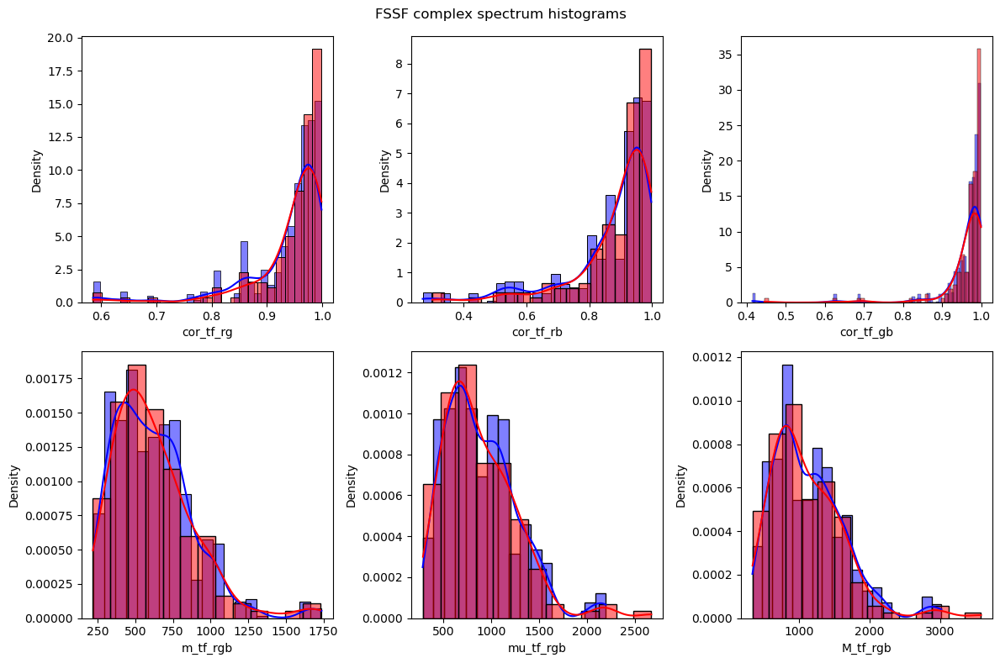

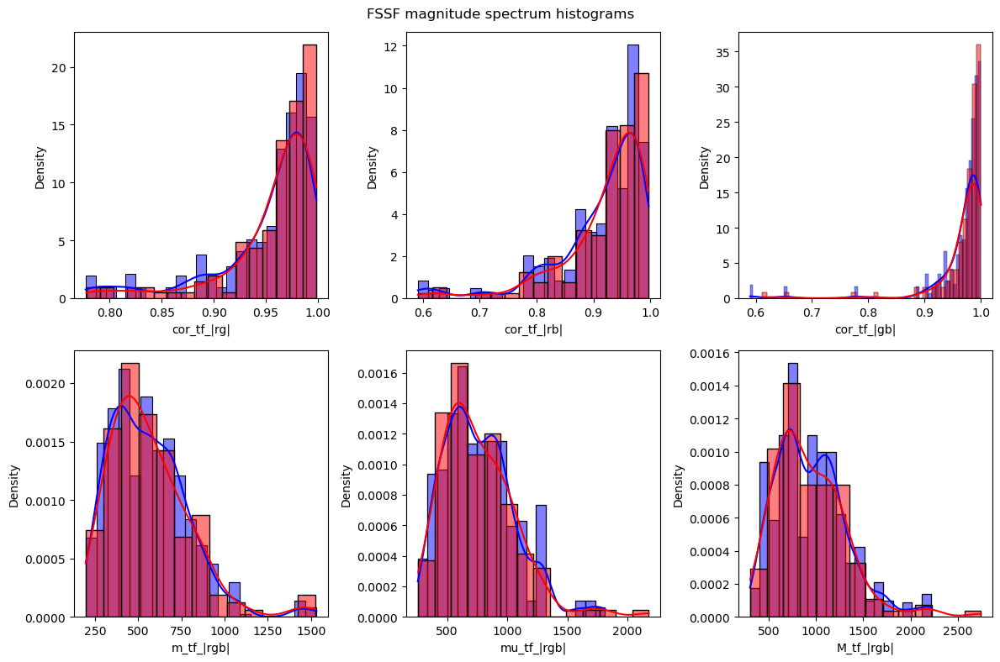

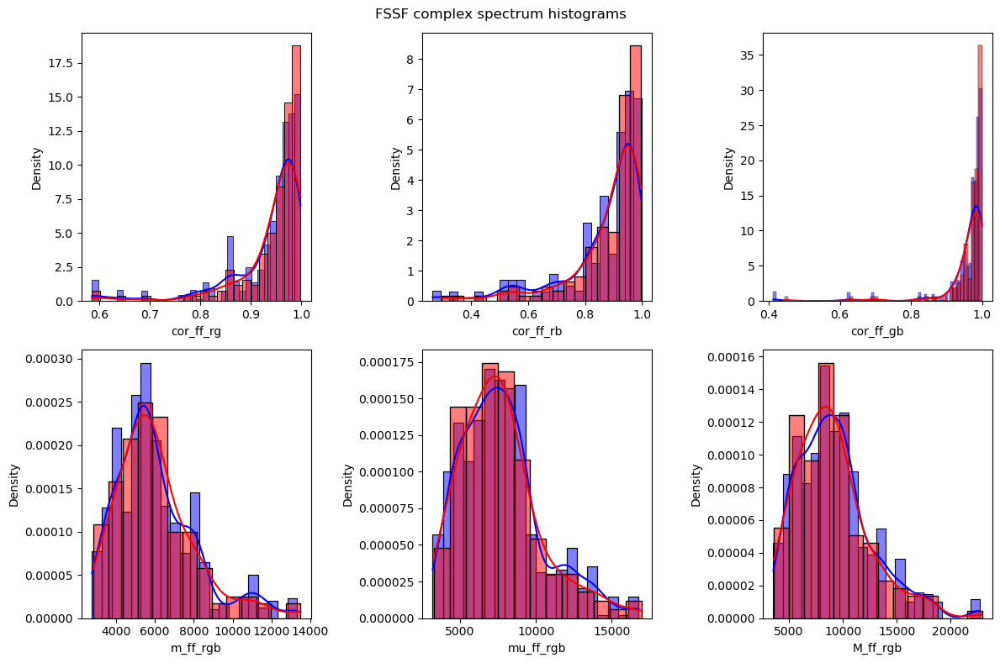

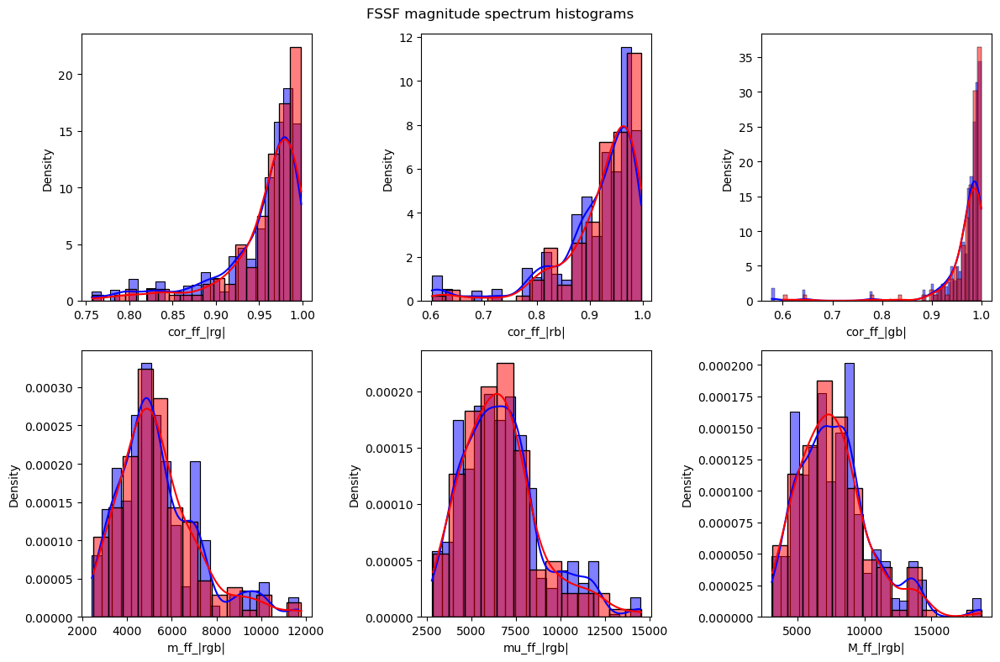

In [82]:
video_spectral_data_real = video_spectral_data[video_spectral_data['label']==0]
display(video_spectral_data_real.describe())
print()
video_spectral_data_fake = video_spectral_data[video_spectral_data['label']==1]
display(video_spectral_data_fake.describe())

hist12([video_spectral_data_real.iloc[:,:12], video_spectral_data_fake.iloc[:,:12]])
hist12([video_spectral_data_real.iloc[:,12:], video_spectral_data_fake.iloc[:,12:]])

Dimensionality reduction tests: Video FSSF
Data scaling: 0 sec
Figure(2000x500)
Prinical Component Analysis (PCA): 0 sec
Subsampling bipassed
Figure(2000x500)
Kernel PCA Polynomial: 2 sec
Figure(2000x500)
Kernel PCA Radial Basis Function (RBF): 2 sec
Figure(2000x500)
Kernel PCA Cosine: 2 sec
Figure(2000x500)
Manifold learning Isomap: 6 sec
Figure(2000x500)
Manifold learning Spectral Embedding: 0 sec
Figure(2000x500)
Manifold learning t-distributed Stochastic Neighbor Embedding (t-SNE): 10 sec
VAE(
  (encoder): Sequential(
    (0): Linear(in_features=24, out_features=20, bias=True)
    (1): BatchNorm1d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=20, out_features=16, bias=True)
    (5): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0.5, inplace=False)
    (8): Linear(in_features=16, out_features=12, bias=True)
    

Epoch:   0%|▏                                                                                  | 1/500 [00:00<?, ?it/s]

VAE training started:


Epoch: 501it [00:30, 16.27it/s, training loss=0.973, validation loss=1.25, best validation loss=1.25]                  


VAE training 500 epochs complete.


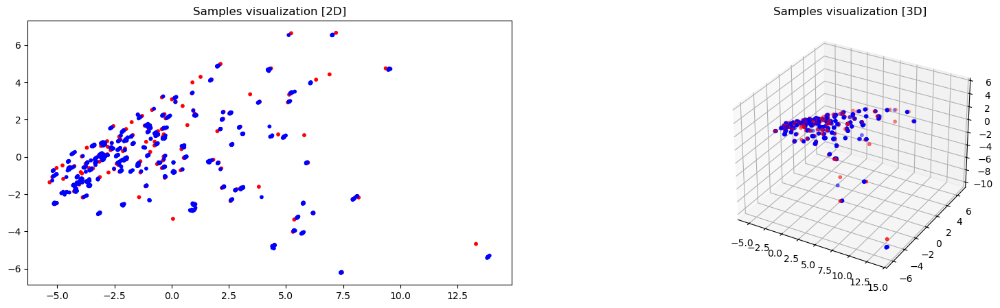

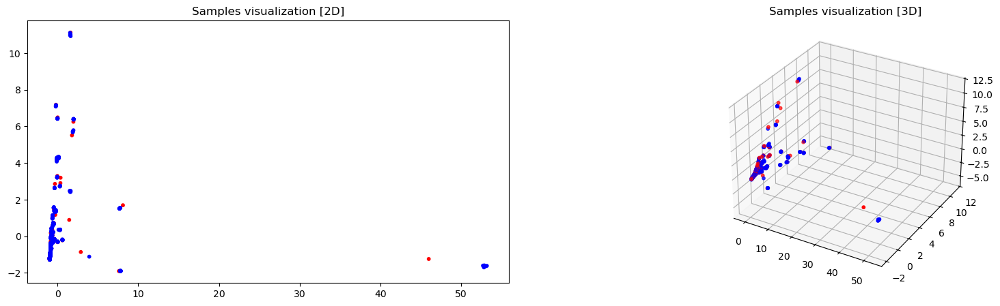

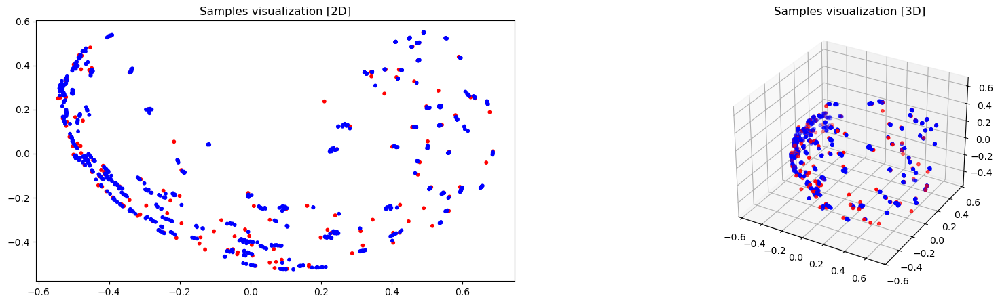

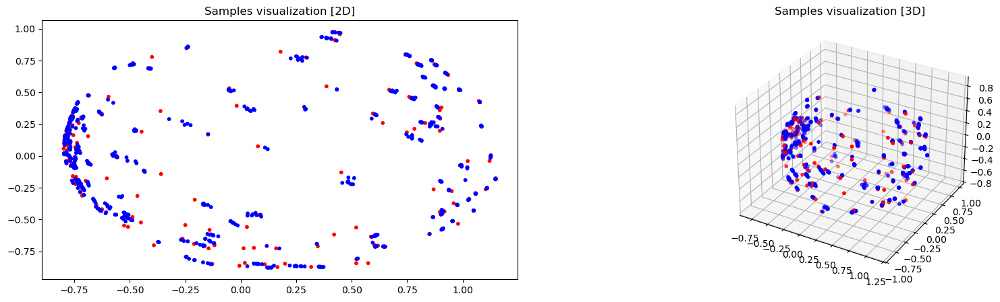

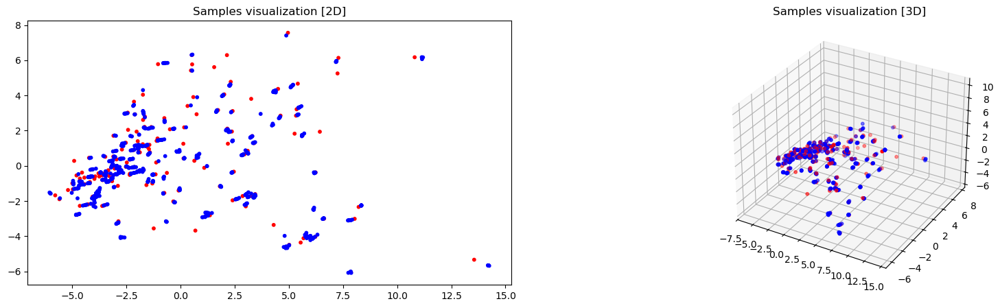

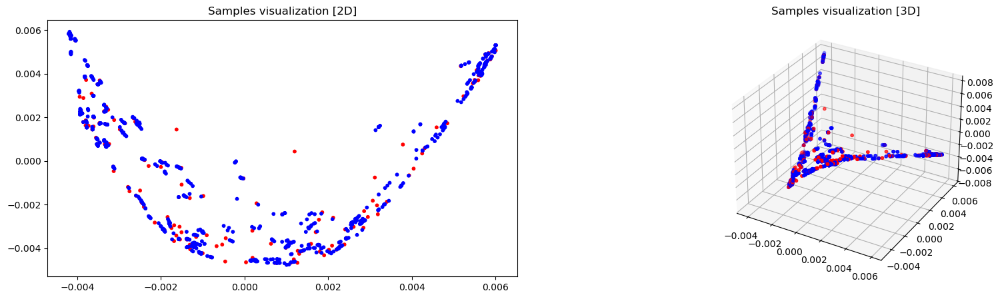

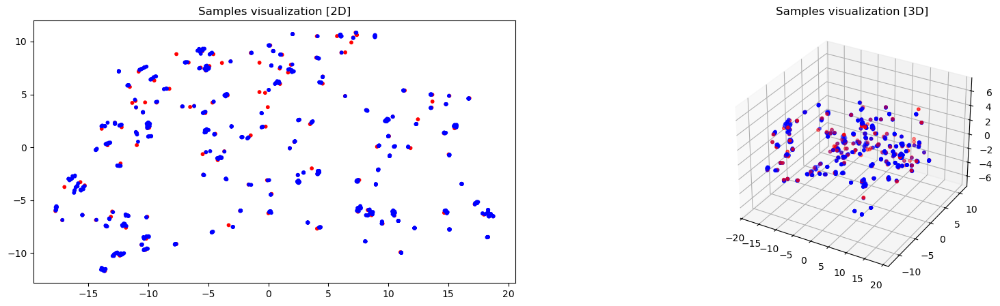

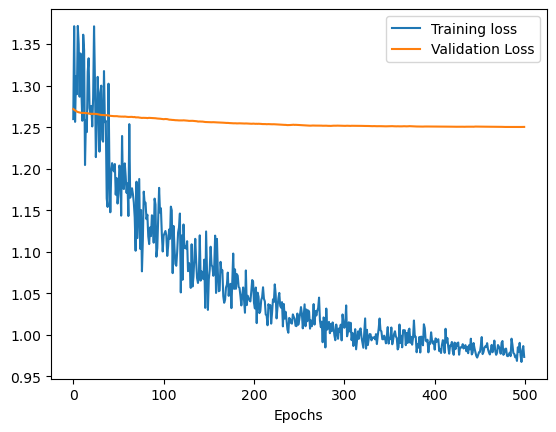

Figure(2000x500)
Variational Autoencoder (VAE): 40 sec
Dimensionality reduction tests complete: 1.0 min 5


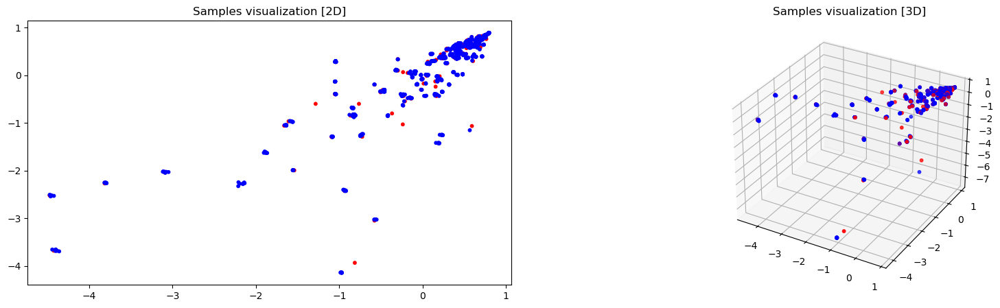

In [88]:
dim_red_tests(video_spectral_data, data_type='Video FSSF', schedule=(24,20,16,12,9,7,5,3), model_path='VAE_model_video', subsample=False)

We have seen that the image-wide, facial, and background FSSF do not produce well segregate data as shown by the significant overlap in the histograms and thorough mixing in the dimensionality reduction methods. Now we will use the combined data imgae-face-background FSSF and attempt a classification algorithm. We will compare its performance by accuracy, precision, recall, F1 score, and analysis of the receiver operating characteristic.

In [4]:
#combo_spectral_data = spec_feat_extr_combo(combo_gen, 'combo_spectral_statistics_running.csv', start_point=0)
#combo_spectral_data.dropna(inplace=True)
#combo_spectral_data.to_csv('combo_spectral_statistics.csv',index=False)
combo_spectral_data = pd.read_csv('combo_spectral_data_frame&video_ids.csv')
combo_spectral_data.describe()

,cor_img_rg,cor_img_rb,cor_img_gb,m_img_rgb,mu_img_rgb,M_img_rgb,cor_img_|rg|,cor_img_|rb|,cor_img_|gb|,m_img_|rgb|,...,m_bkgd_rgb,mu_bkgd_rgb,M_bkgd_rgb,cor_bkgd_|rg|,cor_bkgd_|rb|,cor_bkgd_|gb|,m_bkgd_|rgb|,mu_bkgd_|rgb|,M_bkgd_|rgb|,label
count,353514.000000,353514.000000,353514.000000,353514.000000,353514.000000,353514.000000,353514.000000,353514.000000,353514.000000,353514.000000,...,353514.000000,353514.000000,353514.000000,353514.000000,353514.000000,353514.000000,353514.000000,353514.000000,353514.000000,353514.000000
mean,0.874043,0.747145,0.919217,0.002207,0.003143,0.003981,0.945543,0.903537,0.965019,0.001415,...,0.008506,0.013163,0.017247,0.954228,0.928717,0.959729,0.005674,0.009056,0.011879,0.837047
std,0.153847,0.254058,0.158077,0.000882,0.001360,0.001865,0.054346,0.074634,0.058438,0.000566,...,0.007804,0.013351,0.018862,0.069539,0.083726,0.072436,0.005409,0.009463,0.013249,0.369323
min,0.062688,-0.431877,-0.108375,0.000718,0.000792,0.000873,0.664818,0.617504,0.602274,0.000431,...,0.000000,0.000000,0.000000,0.001760,-0.206638,-0.206638,0.000000,0.000000,0.000000,0.000000
25%,0.862719,0.672936,0.930257,0.001618,0.002224,0.002662,0.934826,0.865917,0.967726,0.001017,...,0.004278,0.005707,0.006836,0.947031,0.905223,0.960693,0.002731,0.003829,0.004609,1.000000
50%,0.927844,0.856468,0.967144,0.002088,0.002937,0.003745,0.965569,0.926615,0.983978,0.001319,...,0.006638,0.009576,0.012094,0.981670,0.959724,0.986501,0.004385,0.006557,0.008333,1.000000
75%,0.963030,0.911706,0.983671,0.002448,0.003708,0.004749,0.980733,0.958193,0.991378,0.001636,...,0.010181,0.015972,0.020955,0.993946,0.986014,0.995604,0.006825,0.011086,0.014522,1.000000
max,0.993999,0.991381,0.998651,0.006595,0.012432,0.017197,0.997789,0.995649,0.999338,0.004369,...,0.307171,0.456892,0.670180,1.000000,1.000000,1.000000,0.201101,0.325683,0.466046,1.000000


Dimensionality reduction tests: Video FSSF
Data scaling: 0 sec
Figure(2000x500)
Prinical Component Analysis (PCA): 2 sec
Subsampling: 0 sec
Figure(2000x500)
Kernel PCA Polynomial: 5959 sec
Figure(2000x500)
Kernel PCA Radial Basis Function (RBF): 5991 sec
Figure(2000x500)
Kernel PCA Cosine: 6048 sec
Figure(2000x500)
Manifold learning Isomap: 169 sec
Figure(2000x500)
Manifold learning Spectral Embedding: 864 sec
Figure(2000x500)
Manifold learning t-distributed Stochastic Neighbor Embedding (t-SNE): 286 sec
VAE(
  (encoder): Sequential(
    (0): Linear(in_features=36, out_features=33, bias=True)
    (1): BatchNorm1d(33, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=33, out_features=30, bias=True)
    (5): BatchNorm1d(30, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0.5, inplace=False)
    (8): Linear(in_features=30, out_features=27, bia

Epoch:   0%|▏                                                                                  | 1/500 [00:00<?, ?it/s]

VAE training started:


Epoch: 501it [55:54,  6.71s/it, training loss=0.874, validation loss=0.926, best validation loss=0.919]                


VAE training 500 epochs complete.


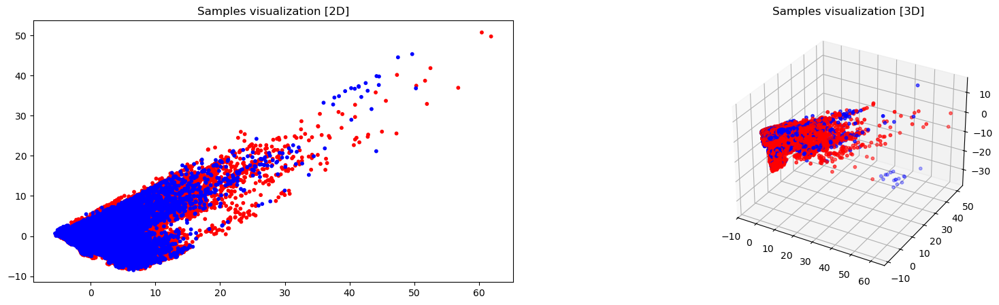

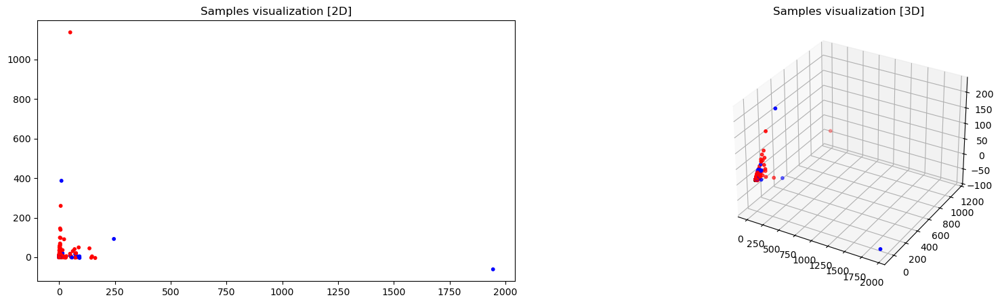

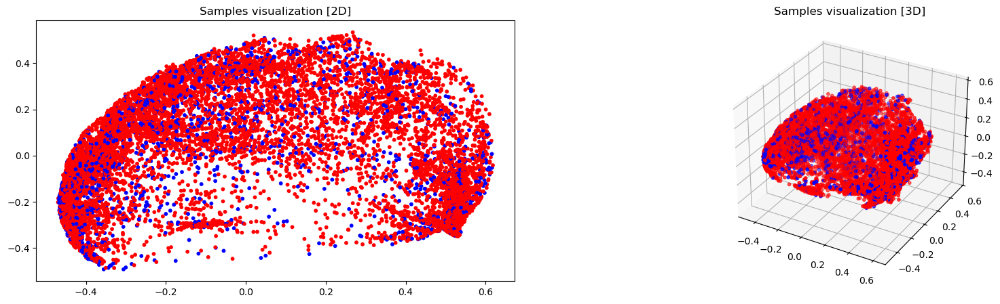

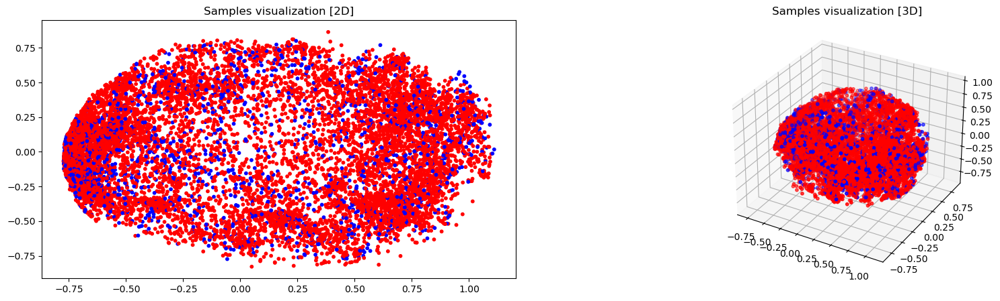

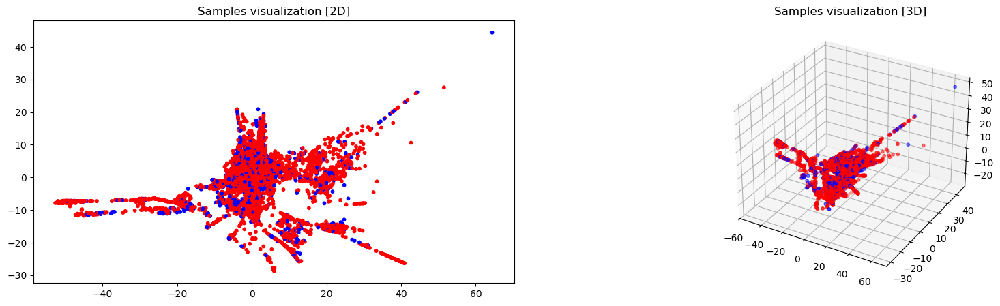

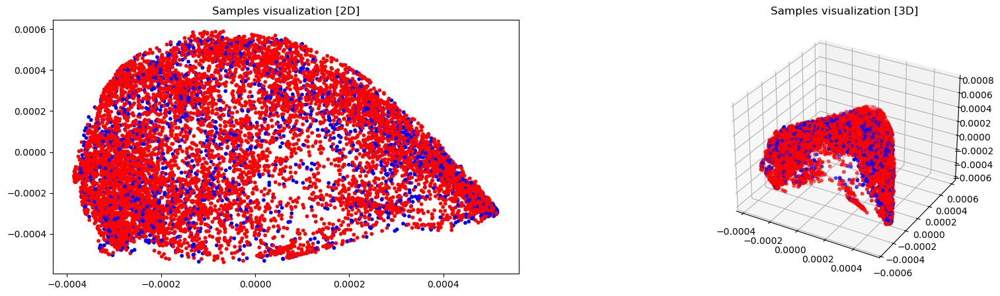

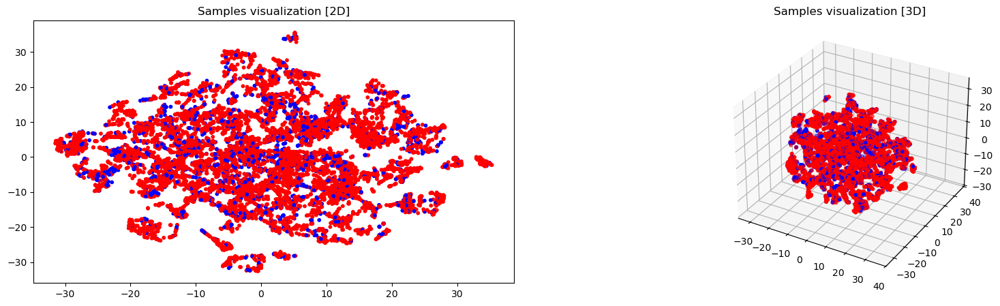

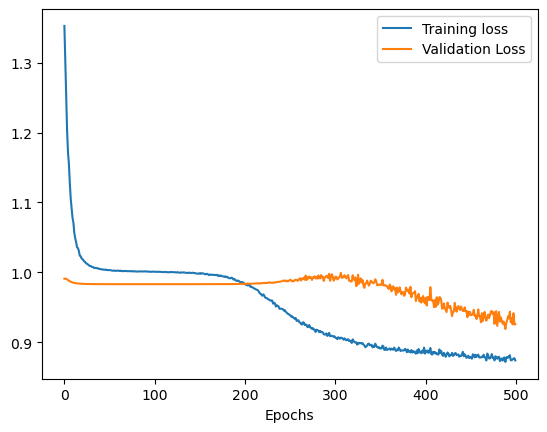

Figure(2000x500)
Variational Autoencoder (VAE): 3388 sec
Dimensionality reduction tests complete: 378.0 min 30


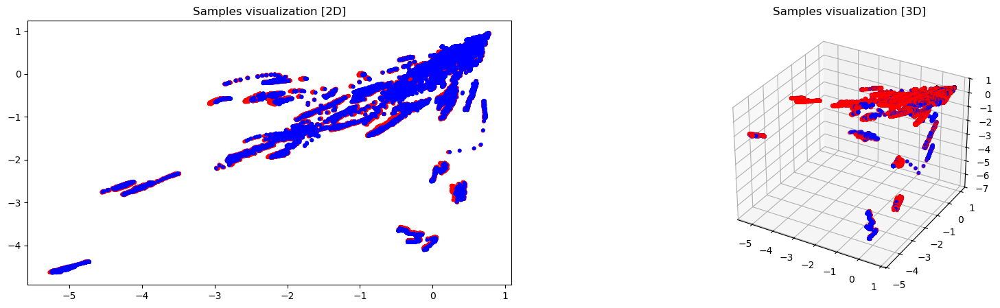

In [96]:
dim_red_tests(combo_spectral_data, data_type='Video FSSF', schedule=(36,33,30,27,24,21,18,15,12,9,7,5,3), model_path='VAE_model_combo')

In [26]:
x_train, x_val, x_test, y_train, y_val, y_test = pre_processing(combo_spectral_data, use_torch=False)

Training completed 0.0 minutes
Accuracy: 58.18%
Precision: 60.84%
Recall: 54.39%
F1: 57.43%
AUC: 58.51%


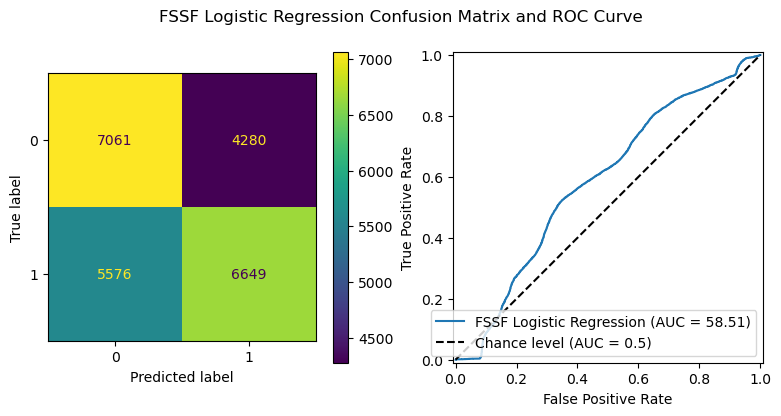

In [27]:
#Logistic Regression
t0 = time.time()
LR = sklearn.linear_model.LogisticRegression()
LR.fit(x_train,y_train)
t1 = time.time()
print(f'Training completed {(t1-t0)//60} minutes')
y_lr, p_lr = LR.predict(x_test), LR.predict_proba(x_test)[:,1]
print_metrics(y_test, y_lr, p_lr, estimator_name='FSSF Logistic Regression')

Training completed 288.0 minutes
Accuracy: 57.8%
Precision: 61.35%
Recall: 50.41%
F1: 55.35%
AUC: 59.36%


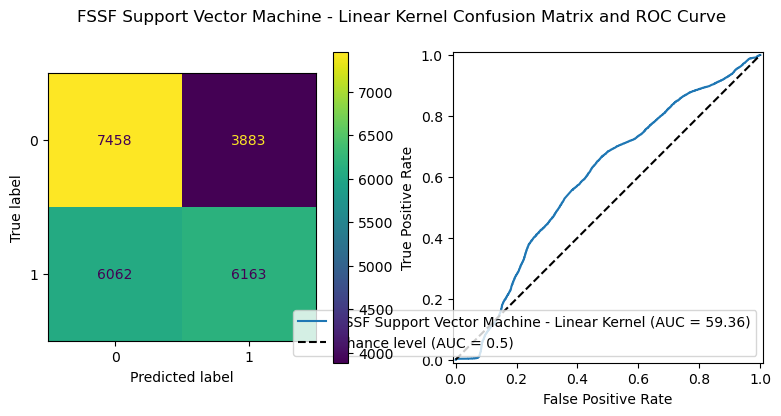

In [31]:
#Linear Support Vector Machine
t0 = time.time()
SCV_L = sklearn.svm.SVC(kernel='linear',probability=True)
SCV_L.fit(x_train,y_train)
t1 = time.time()
print(f'Training completed {(t1-t0)//60} minutes')
y_svc_l, p_svc_l = SCV_L.predict(x_test), SCV_L.predict_proba(x_test)[:,1]
print_metrics(y_test, y_svc_l, p_svc_l, estimator_name='FSSF Support Vector Machine - Linear Kernel')

Training completed 158.0 minutes
Accuracy: 45.48%
Precision: 47.72%
Recall: 53.42%
F1: 50.41%
AUC: 39.47%


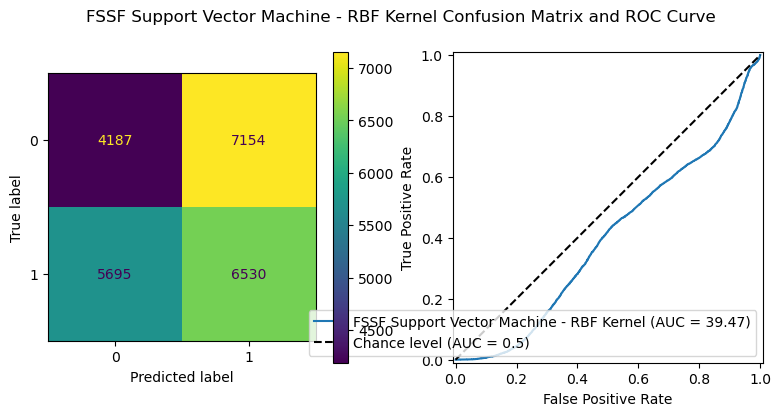

In [32]:
#RBF Kernel Support Vector Machine
t0 = time.time()
SCV_RBF = sklearn.svm.SVC(kernel='rbf',probability=True)
SCV_RBF.fit(x_train,y_train)
t1 = time.time()
print(f'Training completed {(t1-t0)//60} minutes')
y_svc_rbf, p_svc_rbf = SCV_RBF.predict(x_test), SCV_RBF.predict_proba(x_test)[:,1]
print_metrics(y_test, y_svc_rbf, p_svc_rbf, estimator_name='FSSF Support Vector Machine - RBF Kernel')

Training completed 0.0 minutes
Accuracy: 40.74%
Precision: 43.42%
Recall: 46.99%
F1: 45.14%
AUC: 40.49%


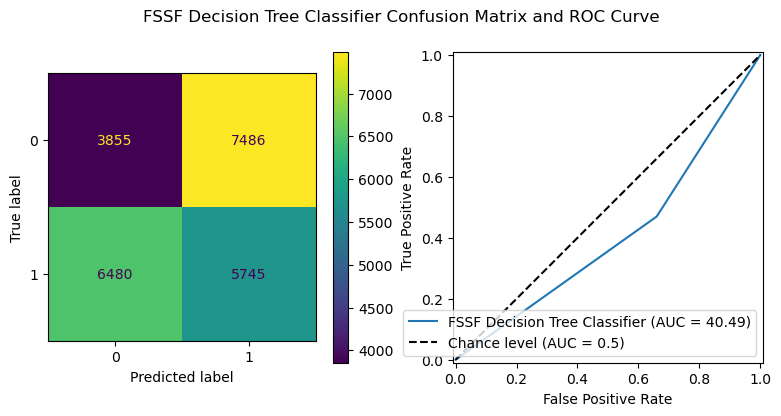

In [28]:
#Decision Tree Classifier
t0 = time.time()
DTC = sklearn.tree.DecisionTreeClassifier()
DTC.fit(x_train.reshape(-1,36),y_train)
t1 = time.time()
print(f'Training completed {(t1-t0)//60} minutes')
y_dtc, p_dtc = DTC.predict(x_test.reshape(-1,36)), DTC.predict_proba(x_test.reshape(-1,36))[:,1]
print_metrics(y_test, y_dtc, p_dtc, estimator_name='FSSF Decision Tree Classifier')

Training completed 33.0 minutes
Accuracy: 43.54%
Precision: 45.82%
Recall: 48.42%
F1: 47.08%
AUC: 30.07%


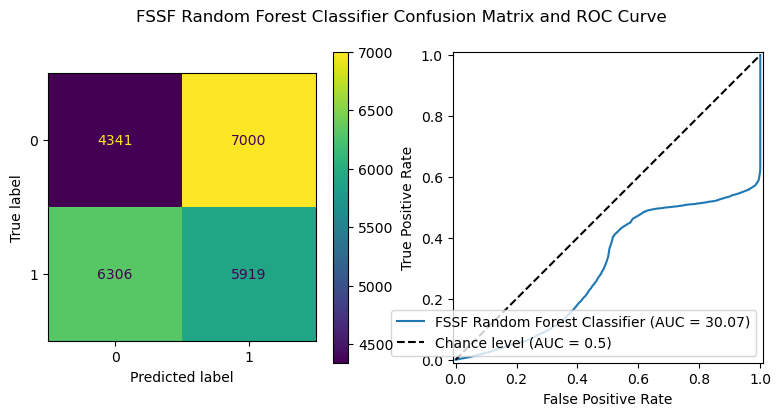

In [30]:
#Random Forest Classifier
t0 = time.time()
RFC = sklearn.ensemble.RandomForestClassifier(n_estimators=1000)
RFC.fit(x_train.reshape(-1,36),y_train)
t1 = time.time()
print(f'Training completed {(t1-t0)//60} minutes')
y_rfc, p_rfc = RFC.predict(x_test.reshape(-1,36)), RFC.predict_proba(x_test.reshape(-1,36))[:,1]
print_metrics(y_test, y_rfc, p_rfc, estimator_name='FSSF Random Forest Classifier')

Because our recorded data does not retain information about the image to video correspondence, ths following scirpt is used to restore that. The data is stored in combo_spectral_temporal_data.csv

In [4]:
x_train, x_val, x_test, y_train, y_val, y_test = pre_processing(combo_spectral_data, use_torch=True)
train_loader, val_loader, test_loader = to_dataloader([x_train, x_val, x_test], [y_train, y_val, y_test], batch_size=1000)

MLP(
  (mlp): Sequential(
    (0): Linear(in_features=36, out_features=33, bias=True)
    (1): BatchNorm1d(33, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=33, out_features=30, bias=True)
    (5): BatchNorm1d(30, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0.5, inplace=False)
    (8): Linear(in_features=30, out_features=27, bias=True)
    (9): BatchNorm1d(27, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): Dropout(p=0.5, inplace=False)
    (12): Linear(in_features=27, out_features=24, bias=True)
    (13): BatchNorm1d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): ReLU()
    (15): Dropout(p=0.5, inplace=False)
    (16): Linear(in_features=24, out_features=21, bias=True)
    (17): BatchNorm1d(21, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
 

Epoch:   1%|▊                                                                                  | 1/100 [00:00<?, ?it/s]

VAE training started:


Epoch: 101it [09:25,  5.66s/it, training loss=0.664, validation loss=0.694, best validation loss=0.69]                 


MLP training 100 epochs complete.


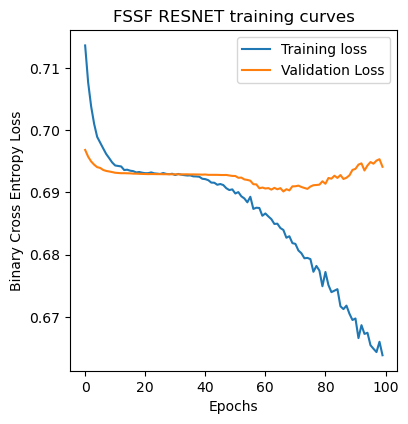

In [60]:
model_mlp = MLP()
model_mlp.MLP_train(train_loader, val_loader, n_epochs=100,model_path='MLP_frame_based_analysis')

In [ ]:
model_mlp = MLP()
model_mlp.load_state_dict(torch.load('MLP_frame_based_analysis', weights_only=True))
model_mlp.MLP_test(test_loader)

MLP(
  (mlp): Sequential(
    (0): Linear(in_features=36, out_features=33, bias=True)
    (1): BatchNorm1d(33, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=33, out_features=30, bias=True)
    (5): BatchNorm1d(30, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0.5, inplace=False)
    (8): Linear(in_features=30, out_features=27, bias=True)
    (9): BatchNorm1d(27, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): Dropout(p=0.5, inplace=False)
    (12): Linear(in_features=27, out_features=24, bias=True)
    (13): BatchNorm1d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): ReLU()
    (15): Dropout(p=0.5, inplace=False)
    (16): Linear(in_features=24, out_features=21, bias=True)
    (17): BatchNorm1d(21, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
 

In [ ]:
#This assumes that the objects vid_img_dict and img_vid_dict have been created or loaded from their csv
#combo_spectral_data = pd.read_csv('combo_spectral_statistics_running.csv')
#columns = 'cor_img_rg,cor_img_rb,cor_img_gb,m_img_rgb,mu_img_rgb,M_img_rgb,cor_img_|rg|,cor_img_|rb|,cor_img_|gb|,m_img_|rgb|,mu_img_|rgb|,M_img_|rgb|,cor_face_rg,cor_face_rb,cor_face_gb,m_face_rgb,mu_face_rgb,M_face_rgb,cor_face_|rg|,cor_face_|rb|,cor_face_|gb|,m_face_|rgb|,mu_face_|rgb|,M_face_|rgb|,cor_bkgd_rg,cor_bkgd_rb,cor_bkgd_gb,m_bkgd_rgb,mu_bkgd_rgb,M_bkgd_rgb,cor_bkgd_|rg|,cor_bkgd_|rb|,cor_bkgd_|gb|,m_bkgd_|rgb|,mu_bkgd_|rgb|,M_bkgd_|rgb|,label'
#columns = columns.split(',')
#columns.append('img_file_name')
#combo_spectral_data['img_file_name'] = combo_spectral_data['img_file_name'].transform(lambda entry: entry.split("'")[1])
#combo_spectral_data['vid_file_name'] = combo_spectral_data['img_file_name'].transform(lambda entry: img_vid_dict[entry])
#combo_spectral_data['img_file_name'] = combo_spectral_data['img_file_name'].transform(lambda entry: int(entry.split('.')[1]))
#vid_to_num = dict(zip(list(vid_img_dict.keys()),range(len(list(vid_img_dict.keys())))))
#combo_spectral_data['vid_file_name'] = combo_spectral_data['vid_file_name'].transform(lambda entry: vid_to_num[entry])
#combo_spectral_data = combo_spectral_data.rename(columns={'img_file_name':'img', 'vid_file_name':'vid'})
#combo_spectral_data.dropna(inplace=True)
#combo_spectral_data.sort_values(by='vid',inplace=True)
#for ind in range(952):
#    combo_spectral_data[combo_spectral_data['vid']==ind].sort_values(by='img',inplace=True)
#combo_spectral_data.to_csv('combo_spectral_data_frame&video_ids.csv',index=False)

In [51]:
video_spectral_data = pd.read_csv('video_spectral_statistics.csv')
def real_fake_balance(data_frame, seed):
        real_data, fake_data = data_frame[data_frame['label']==0], data_frame[data_frame['label']==1]
        random.seed(seed)
        sample = random.sample(range(len(fake_data)), len(real_data))
        fake_data = fake_data.iloc[sample]
        return pd.concat([real_data, fake_data])
video_spectral_data = real_fake_balance(video_spectral_data, seed)
def train_validate_test(data_frame, tvt=(.2,.01), seed=seed):
    x, y = data_frame.drop(columns='label'), data_frame['label'].astype('int')
    x_scaled = sklearn.preprocessing.StandardScaler().fit_transform(x)
    x_train, x_test, y_train, y_test = sklearn.model_selection.train_test_split(x_scaled, y, test_size=tvt[0], random_state=seed)
    x_train, x_val, y_train, y_val = sklearn.model_selection.train_test_split(x_train, y_train, test_size=tvt[1], random_state=seed)
    return x_train, x_val, x_test, y_train, y_val, y_test
x_train, x_val, x_test, y_train, y_val, y_test = train_validate_test(video_spectral_data)

Training completed 0.0 minutes
Accuracy: 53.12%
Precision: 62.07%
Recall: 48.65%
F1: 54.55%
AUC: 48.55%


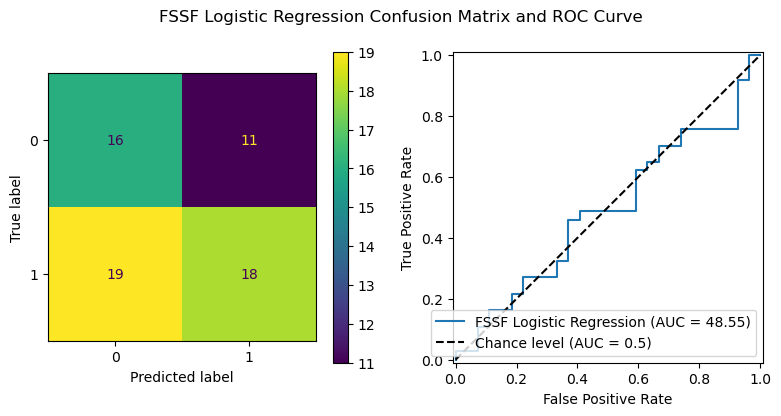

In [53]:
#Logistic Regression - whole video statistics
t0 = time.time()
LR = sklearn.linear_model.LogisticRegression()
LR.fit(x_train,y_train)
t1 = time.time()
print(f'Training completed {(t1-t0)//60} minutes')
y_lr, p_lr = LR.predict(x_test), LR.predict_proba(x_test)[:,1]
print_metrics(y_test, y_lr, p_lr, estimator_name='FSSF Logistic Regression')

Training completed 0.0 minutes
Accuracy: 46.88%
Precision: 55.56%
Recall: 40.54%
F1: 46.88%
AUC: 55.36%


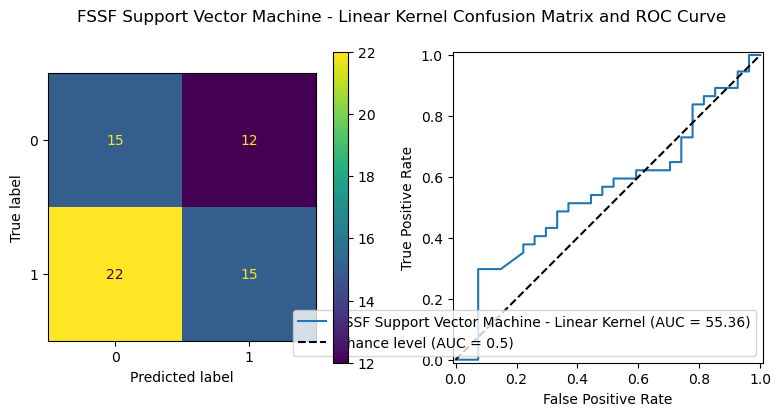

In [54]:
#Linear Support Vector Machine - whole video statistics
t0 = time.time()
SCV_L = sklearn.svm.SVC(kernel='linear',probability=True)
SCV_L.fit(x_train,y_train)
t1 = time.time()
print(f'Training completed {(t1-t0)//60} minutes')
y_svc_l, p_svc_l = SCV_L.predict(x_test), SCV_L.predict_proba(x_test)[:,1]
print_metrics(y_test, y_svc_l, p_svc_l, estimator_name='FSSF Support Vector Machine - Linear Kernel')

Training completed 0.0 minutes
Accuracy: 42.19%
Precision: 50.0%
Recall: 18.92%
F1: 27.45%
AUC: 61.91%


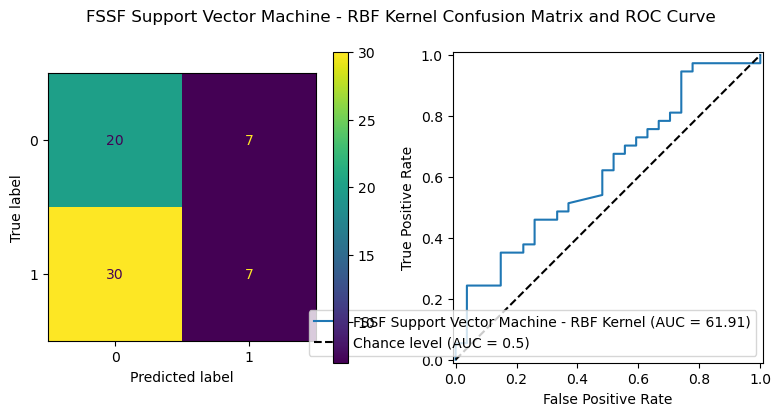

In [55]:
#RBF Kernel Support Vector Machine - whole video statistics
t0 = time.time()
SCV_RBF = sklearn.svm.SVC(kernel='rbf',probability=True)
SCV_RBF.fit(x_train,y_train)
t1 = time.time()
print(f'Training completed {(t1-t0)//60} minutes')
y_svc_rbf, p_svc_rbf = SCV_RBF.predict(x_test), SCV_RBF.predict_proba(x_test)[:,1]
print_metrics(y_test, y_svc_rbf, p_svc_rbf, estimator_name='FSSF Support Vector Machine - RBF Kernel')